We want to test to see if a teacher's salary after switching is statistically different that it WOULD HAVE been, had they stayed in the same district.  How do we know what it would have been?  Salary schedules on Collective Bargaining Agreements.

In [1]:
import numpy as np
import scipy.stats as stats

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import pandas as pd
import seaborn as sns

import plotly
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
# pio.renderers.default='notebook'

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

import statsmodels
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.tsa.stattools import acf

# Optional 
import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed, interact_manual
matplotlib.rcParams['figure.figsize'] = 7, 7
%matplotlib inline



In [2]:
file = "./fullteach_PARTLY_cleaned_names.csv"
df = pd.read_csv(file)
df

,Unnamed: 0,name,position,pay_and_benefits,year,dist,enrollment,pay_and_benefits_adjusted,cleaned_names
0,1,A RICE-HEALY,SPEECH /LANGUAGE PATHOLOGIST,99517.0,2014,SAN DIEGO UNIFIED,130303,96514.708781,A RICE-HEALY
1,2,A RICE-HEALY,SPEECH /LANGUAGE PATHOLOGIST,114043.0,2016,SAN DIEGO UNIFIED,129380,109095.103651,A RICE-HEALY
2,3,A RICE-HEALY,SPEECH /LANGUAGE PATHOLOGIST,117526.0,2017,SAN DIEGO UNIFIED,128040,110081.855597,A RICE-HEALY
3,4,A RICE-HEALY,SPEECH /LANGUAGE PATHOLOGIST,115337.0,2018,SAN DIEGO UNIFIED,126400,105455.774542,A RICE-HEALY
4,5,A RICE-HEALY,SPEECH /LANGUAGE PATHOLOGIST,115337.0,2019,SAN DIEGO UNIFIED,124105,103578.948271,A RICE-HEALY
...,...,...,...,...,...,...,...,...,...
214296,214297,ZULMA RIVERA,REGULAR TEACHER,129393.0,2020,SAN DIEGO UNIFIED,129460,114785.911117,ZULMA RIVERA
214297,214298,ZULMA RIVERA,TEACHER-BILINGUAL EDUCATION,142689.0,2021,SAN DIEGO UNIFIED,118523,120900.978950,ZULMA RIVERA
214298,214299,ZULMA RIVERA,TEACHER-BILINGUAL EDUCATION,142418.0,2022,SAN DIEGO UNIFIED,114450,111729.915060,ZULMA RIVERA
214299,214300,CHRISTINE ZUNIGA,REGULAR TEACHER,89061.0,2013,SAN DIEGO UNIFIED,130270,87775.302884,CHRISTINE ZUNIGA


In [3]:
# Extract unique positions from the dataset
unique_positions = df['position'].unique()

# Display the unique positions
for position in unique_positions:
    print(position)


SPEECH /LANGUAGE PATHOLOGIST
TEACHER-DEAF ED
TEACHER
SCHOOL PSYCHOLOGIST
REGULAR TEACHER
TEACHER-LCM
TEACHER, JOB SHARE
LANGUAGE ARTS SPECIALIST
ADVANCED PLACEMENT TEACHER
TCHR
NURSE
SPEC ED TCHR - MILD/MOD PERS
TEACHER-LEARNING HANDICAPPED
TEACHER HOURLY TEACHING RATE
ROP TEACHER
TEACHER - CTE
INTERVENTION TEACHER
TEACHER-K
TEACHER-1
TEACHER-2
TEAM LEADER TEACHER
COUNSELOR
CTE TEACHER
TEACHER-MILD/MODERATE
TEACHER-SMHS
TEACHER,BVM
TEACHER OF THE SEVERELY HANDICAPPED
SDC TEACHER
TEACHER-MATH
TEACHER-MATH/TECH ED
TEACHER-MATH (CSR)
HEAD COUNSELOR I
TEACHER,CPH
TEACHER-GENERAL ED
TEACHER,OLH
SPECIAL EDUCATION TEACHER
TEACHER - MHHS
TEACHER-MHHS
HIGH SCHOOL MATH TEACHER
HEAD COUNSELOR II
RES TCHR CHARTER SCHOOL
TEACHER CHARTER
RESOURCE TEACHER
SPEECH-LANGUAGE PATHOLOGIST
SPEECH LANGUAGE PATHOLOGIST
OCCUPATIONAL THERAPIST
TEACHER-PAL
PROJECT RESOURCE TEACHER
TEACHER-SPECIAL ED
SP ED TEACHER - MILD/MODERATE
TCHR.
TEACHER-1 BIL-DLP
TEACHER-DISTRICT ROVER (CSR)
TCHR-MILD/MOD (SPEC DAY CLASS)


In [4]:
import pandas as pd


# Define the categorization logic based on keywords in the 'position' column
def categorize_position(position):

    position = position.lower()
    
    # Teacher-related positions
    if any(keyword in position for keyword in ['teacher', 'education','tchr']):
        return 'Teacher'
    # Health-related positions
    elif any(keyword in position for keyword in ['nurse', 'psychologist', 'pathologist', 'therapist', 'counselor', 'psych', 'therapy', 'specialist', 'consultant', 'psycht']):
        return 'Health'
    # Administration-related positions
    elif any(keyword in position for keyword in ['principal', 'admin', 'director', 'superintendent', 'coach', 'librarian', 'technician']):
        return 'Administration'
    else:
        return 'Other'

# Apply the categorization to the 'position' column
df['category'] = df['position'].apply(categorize_position)


df.to_csv('updated_file.csv', index=False)
df_1 = pd.read_csv('./updated_file.csv')
df_1

,Unnamed: 0,name,position,pay_and_benefits,year,dist,enrollment,pay_and_benefits_adjusted,cleaned_names,category
0,1,A RICE-HEALY,SPEECH /LANGUAGE PATHOLOGIST,99517.0,2014,SAN DIEGO UNIFIED,130303,96514.708781,A RICE-HEALY,Health
1,2,A RICE-HEALY,SPEECH /LANGUAGE PATHOLOGIST,114043.0,2016,SAN DIEGO UNIFIED,129380,109095.103651,A RICE-HEALY,Health
2,3,A RICE-HEALY,SPEECH /LANGUAGE PATHOLOGIST,117526.0,2017,SAN DIEGO UNIFIED,128040,110081.855597,A RICE-HEALY,Health
3,4,A RICE-HEALY,SPEECH /LANGUAGE PATHOLOGIST,115337.0,2018,SAN DIEGO UNIFIED,126400,105455.774542,A RICE-HEALY,Health
4,5,A RICE-HEALY,SPEECH /LANGUAGE PATHOLOGIST,115337.0,2019,SAN DIEGO UNIFIED,124105,103578.948271,A RICE-HEALY,Health
...,...,...,...,...,...,...,...,...,...,...
214296,214297,ZULMA RIVERA,REGULAR TEACHER,129393.0,2020,SAN DIEGO UNIFIED,129460,114785.911117,ZULMA RIVERA,Teacher
214297,214298,ZULMA RIVERA,TEACHER-BILINGUAL EDUCATION,142689.0,2021,SAN DIEGO UNIFIED,118523,120900.978950,ZULMA RIVERA,Teacher
214298,214299,ZULMA RIVERA,TEACHER-BILINGUAL EDUCATION,142418.0,2022,SAN DIEGO UNIFIED,114450,111729.915060,ZULMA RIVERA,Teacher
214299,214300,CHRISTINE ZUNIGA,REGULAR TEACHER,89061.0,2013,SAN DIEGO UNIFIED,130270,87775.302884,CHRISTINE ZUNIGA,Teacher


In [5]:
# Function to categorize teachers by subject
teacher_data = df[df['category'] == 'Teacher'].copy()


def categorize_teacher_subject(position):
    position = position.lower()
    
    if 'math' in position:
        return 'Math'
    elif any(subject in position for subject in ['english', 'writing', 'language art','deaf','bilingual']):
        return 'English/Language Arts/Language'
    elif 'science' in position:
        return 'Science'
    elif 'pe' in position or 'physical education' in position:
        return 'PE'
    elif any(subject in position for subject in ['special education', 'SPED', 'SPEC ED']):
        return 'Special Education'
    elif 'art' in position:
        return 'Art'
    else:
        return 'Other'

# Apply the function to the dataset
teacher_data['subject'] = teacher_data['position'].apply(categorize_teacher_subject)
teacher_data

,Unnamed: 0,name,position,pay_and_benefits,year,dist,enrollment,pay_and_benefits_adjusted,cleaned_names,category,subject
8,9,SUSAN AABERG,TEACHER-DEAF ED,94992.00,2013,SAN DIEGO UNIFIED,130270,93620.682134,SUSAN AABERG,Teacher,English/Language Arts/Language
9,10,AAMNA KAMIL,TEACHER,67045.93,2012,GROSSMONT UNION HIGH,23675,67045.930000,AAMNA KAMIL,Teacher,Other
10,11,AAMNA KAMIL,TEACHER,70615.32,2013,GROSSMONT UNION HIGH,22965,69595.907314,AAMNA KAMIL,Teacher,Other
11,12,AAMNA KAMIL,TEACHER,77772.07,2014,GROSSMONT UNION HIGH,22555,75425.793456,AAMNA KAMIL,Teacher,Other
12,13,AAMNA KAMIL,TEACHER,78886.21,2015,GROSSMONT UNION HIGH,22220,76415.617862,AAMNA KAMIL,Teacher,Other
...,...,...,...,...,...,...,...,...,...,...,...
214296,214297,ZULMA RIVERA,REGULAR TEACHER,129393.00,2020,SAN DIEGO UNIFIED,129460,114785.911117,ZULMA RIVERA,Teacher,Other
214297,214298,ZULMA RIVERA,TEACHER-BILINGUAL EDUCATION,142689.00,2021,SAN DIEGO UNIFIED,118523,120900.978950,ZULMA RIVERA,Teacher,English/Language Arts/Language
214298,214299,ZULMA RIVERA,TEACHER-BILINGUAL EDUCATION,142418.00,2022,SAN DIEGO UNIFIED,114450,111729.915060,ZULMA RIVERA,Teacher,English/Language Arts/Language
214299,214300,CHRISTINE ZUNIGA,REGULAR TEACHER,89061.00,2013,SAN DIEGO UNIFIED,130270,87775.302884,CHRISTINE ZUNIGA,Teacher,Other


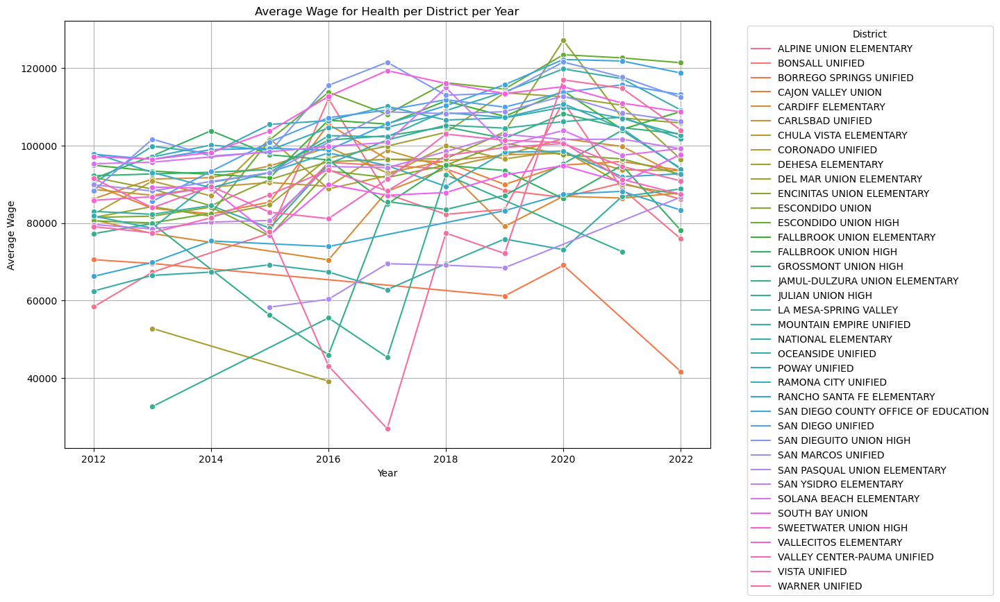

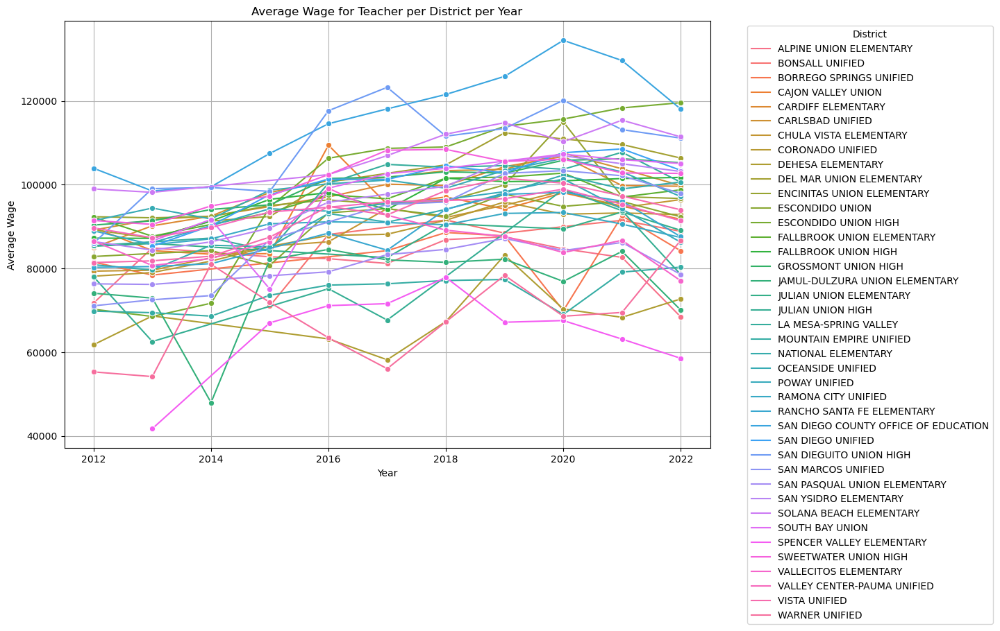

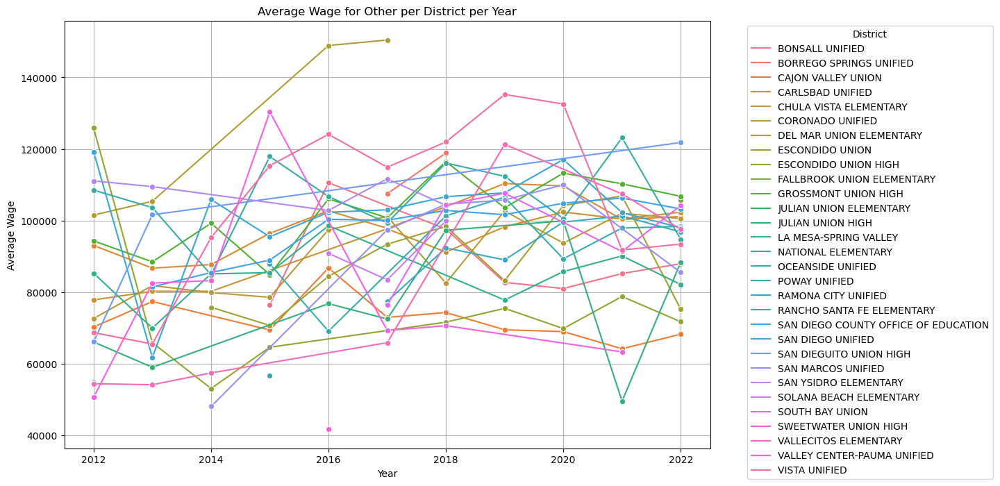

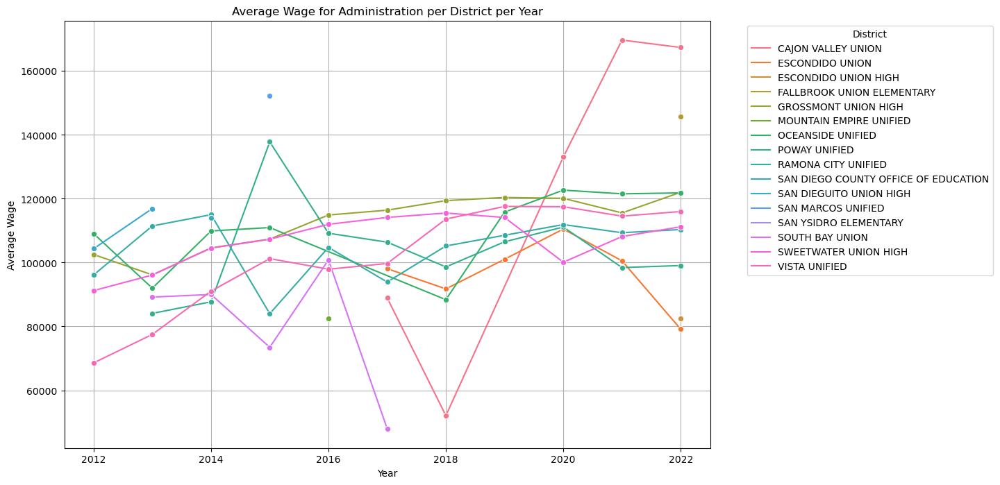

In [6]:
# Group by district, year, and category to calculate the average wage
average_wage_df = df.groupby(['dist', 'year', 'category'])['pay_and_benefits_adjusted'].mean().reset_index()


categories = df['category'].unique()

# Plot a separate graph for each category
for category in categories:
    # Filter the data for the current category
    category_data = average_wage_df[average_wage_df['category'] == category]

    
    plt.figure(figsize=(12, 8))
    
    # Plot the data for all districts in this category
    sns.lineplot(data=category_data, x='year', y='pay_and_benefits_adjusted', hue='dist', marker='o')

    # Set title and labels for the plot
    plt.title(f'Average Wage for {category} per District per Year')
    plt.xlabel('Year')
    plt.ylabel('Average Wage')
    plt.legend(title='District', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    
    # Show the plot
    plt.show()

In [7]:
df.columns


Index(['Unnamed: 0', 'name', 'position', 'pay_and_benefits', 'year', 'dist',
       'enrollment', 'pay_and_benefits_adjusted', 'cleaned_names', 'category'],
      dtype='object')

In [8]:
teacher_data.sort_values(by=['name', 'year', 'dist'], inplace=True)

# Identify teachers who worked in more than one district in the same year
multi_dist = teacher_data.groupby(['name', 'year'])['dist'].nunique().reset_index()
multi_dist = multi_dist[multi_dist['dist'] > 1]

#Filter out teachers who worked in multiple districts in the same year
teacher_data_single_dist = teacher_data[~teacher_data['name'].isin(multi_dist['name'])]

# Confirm that only single-district-per-year entries remain
assert teacher_data_single_dist.groupby(['name', 'year'])['dist'].nunique().max() == 1

#Create a column that indicates a switch in districts
teacher_data_single_dist['district_switch'] = (teacher_data_single_dist['dist'] != teacher_data_single_dist['dist'].shift(1)) & (teacher_data_single_dist['name'] == teacher_data_single_dist['name'].shift(1))

#Filter for rows where a district switch occurred
single_switch_df = teacher_data_single_dist[teacher_data_single_dist['district_switch']].copy()

#Extract the previous district and salary information, also carry over 'category' and 'subject'
single_switch_df['previous_dist'] = teacher_data_single_dist['dist'].shift(1)
single_switch_df['previous_pay_and_benefits'] = teacher_data_single_dist['pay_and_benefits_adjusted'].shift(1)

single_switch_df.dropna(inplace=True)


single_switch_df.rename(columns={
    'dist': 'new_dist',
    'pay_and_benefits_adjusted': 'new_pay_and_benefits',
}, inplace=True)

single_switch_df = single_switch_df[['name', 'year', 'previous_dist', 'new_dist', 'previous_pay_and_benefits', 'new_pay_and_benefits', 'category', 'subject']]

single_switch_df

C:\Users\khali\AppData\Local\Temp\ipykernel_10228\3301028581.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teacher_data_single_dist['district_switch'] = (teacher_data_single_dist['dist'] != teacher_data_single_dist['dist'].shift(1)) & (teacher_data_single_dist['name'] == teacher_data_single_dist['name'].shift(1))


,name,year,previous_dist,new_dist,previous_pay_and_benefits,new_pay_and_benefits,category,subject
285,AARON PLUMB,2020,SAN DIEGO UNIFIED,CAJON VALLEY UNION,80293.270488,88858.327521,Teacher,Other
324,AARON SILVERTHORN,2016,GROSSMONT UNION HIGH,RAMONA CITY UNIFIED,59739.992980,59584.601607,Teacher,Other
509,ABIGAIL BUELNA,2020,CHULA VISTA ELEMENTARY,ESCONDIDO UNION,98301.162962,51007.976500,Teacher,Other
510,ABIGAIL BUELNA,2022,ESCONDIDO UNION,SAN YSIDRO ELEMENTARY,51007.976500,58146.697700,Teacher,Other
615,ABRAHAM SHKLAR,2020,VISTA UNIFIED,SAN DIEGO UNIFIED,80835.681761,77541.456685,Teacher,Other
...,...,...,...,...,...,...,...,...
212322,WILLIAM REALIN,2021,NATIONAL ELEMENTARY,SAN DIEGO UNIFIED,71555.489997,70337.257711,Teacher,PE
213143,YENNI ELSAS,2016,NATIONAL ELEMENTARY,CHULA VISTA ELEMENTARY,71681.643059,78651.262778,Teacher,Other
213824,YVONNE MARTIN-VALLEJO,2016,SWEETWATER UNION HIGH,NATIONAL ELEMENTARY,67635.108939,79553.311294,Teacher,Other
213938,ZACHARY PONDER,2019,ESCONDIDO UNION HIGH,SAN DIEGUITO UNION HIGH,82635.453372,97760.451120,Teacher,Other


## Average wage comparison of switchers that left a district to teachers who stayed (Switch-out

C:\Users\khali\AppData\Local\Temp\ipykernel_10228\2693991709.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teacher_data_single_dist['previous_pay_and_benefits'] = teacher_data_single_dist['pay_and_benefits_adjusted'].shift(1)
C:\Users\khali\AppData\Local\Temp\ipykernel_10228\2693991709.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teacher_data_single_dist['wage_increase'] = teacher_data_single_dist['pay_and_benefits_adjusted'] - teacher_data_single_dist['previous_pay_and_benefits']


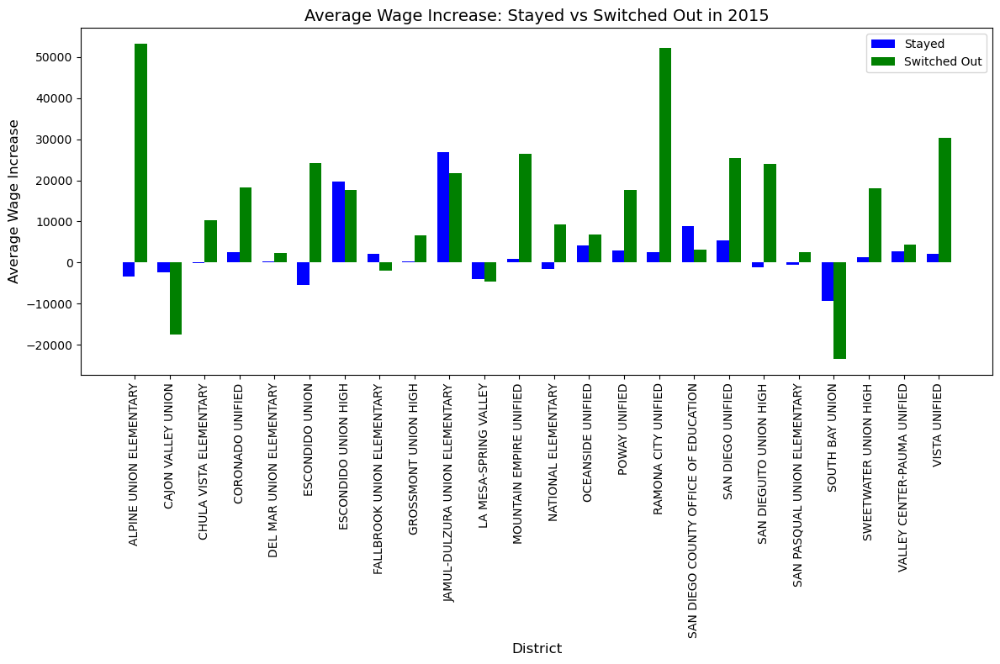

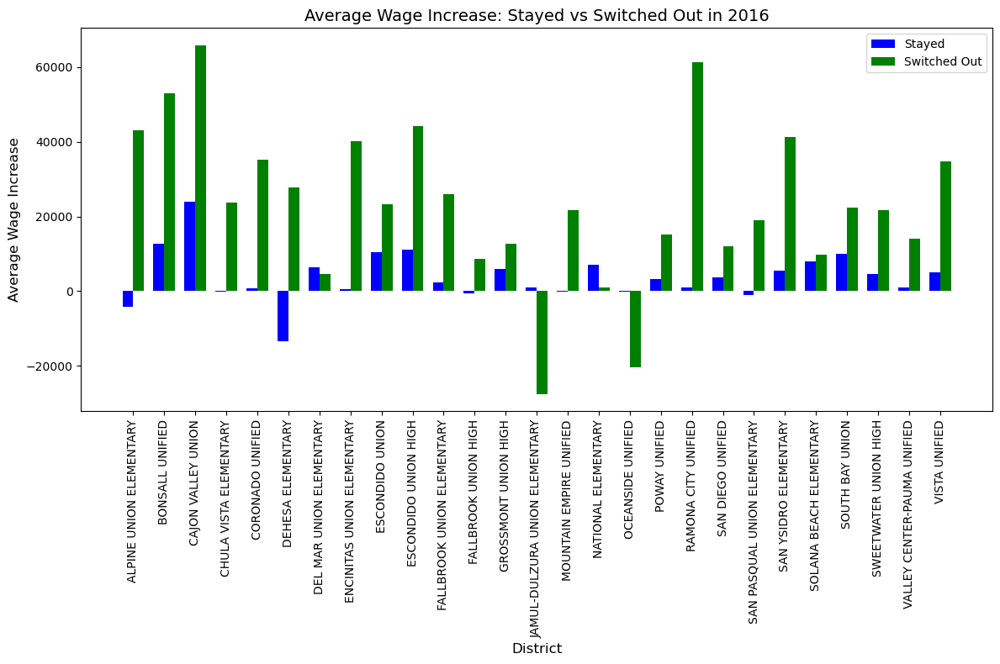

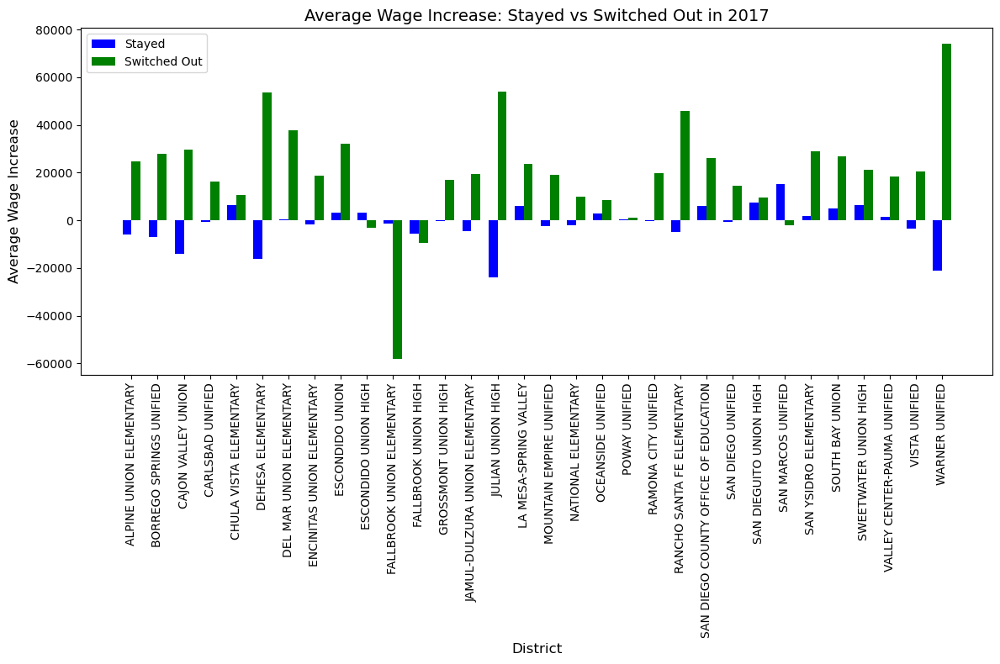

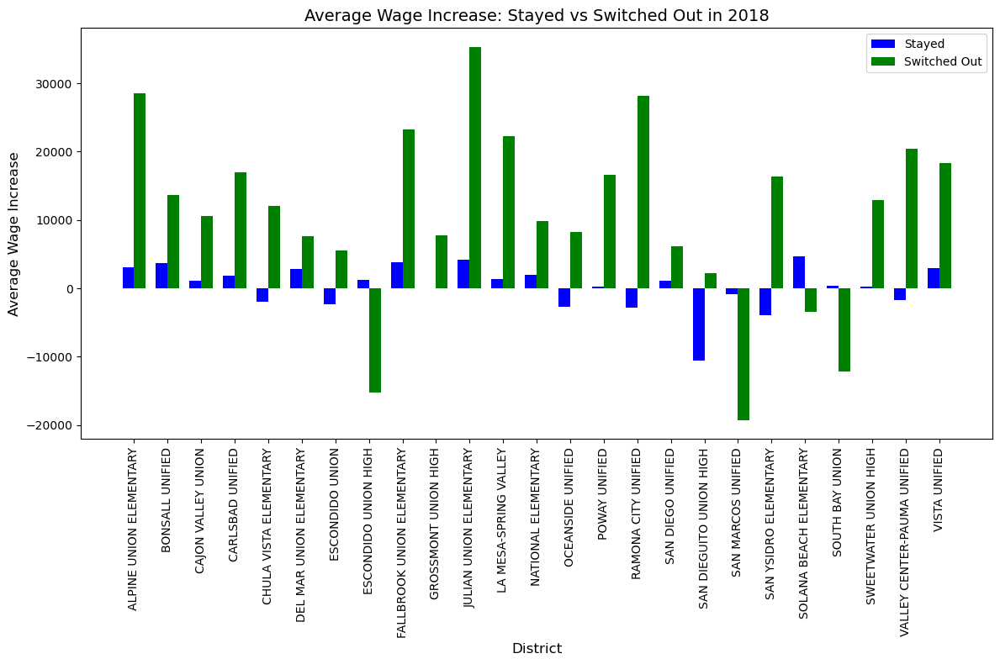

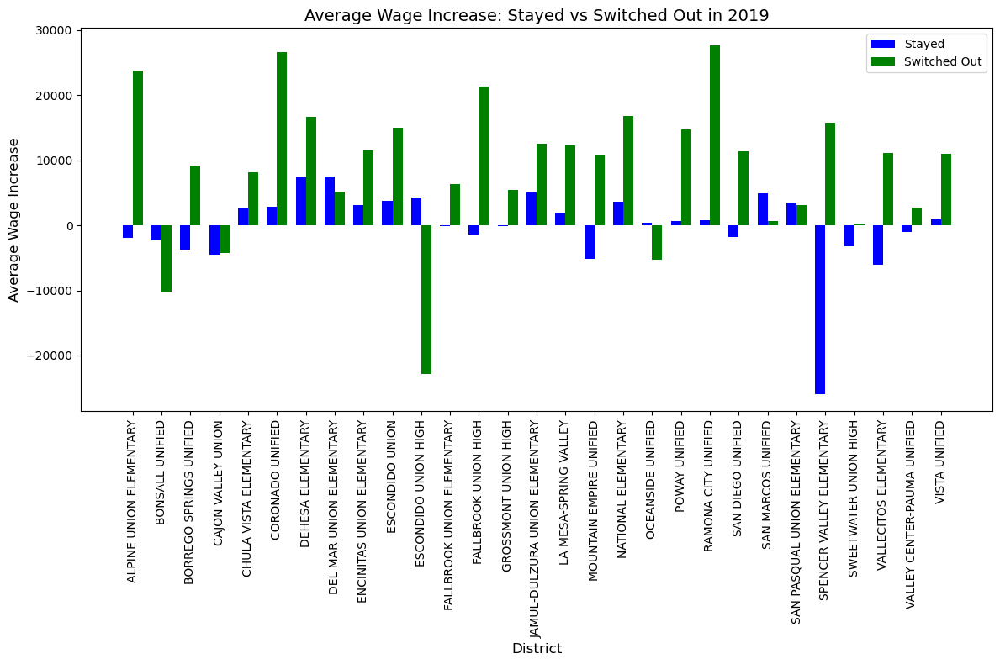

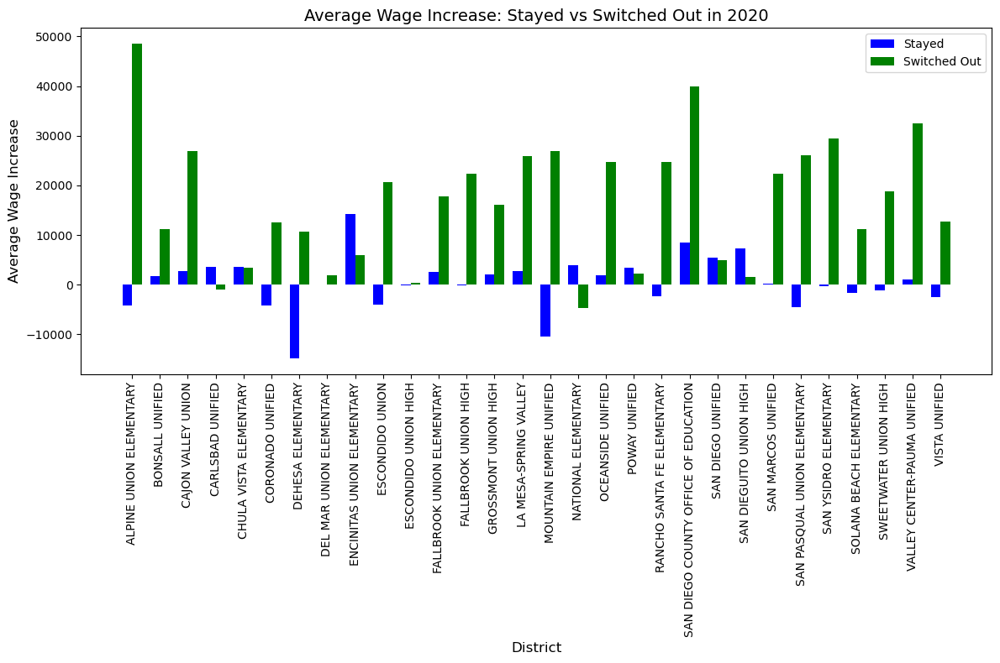

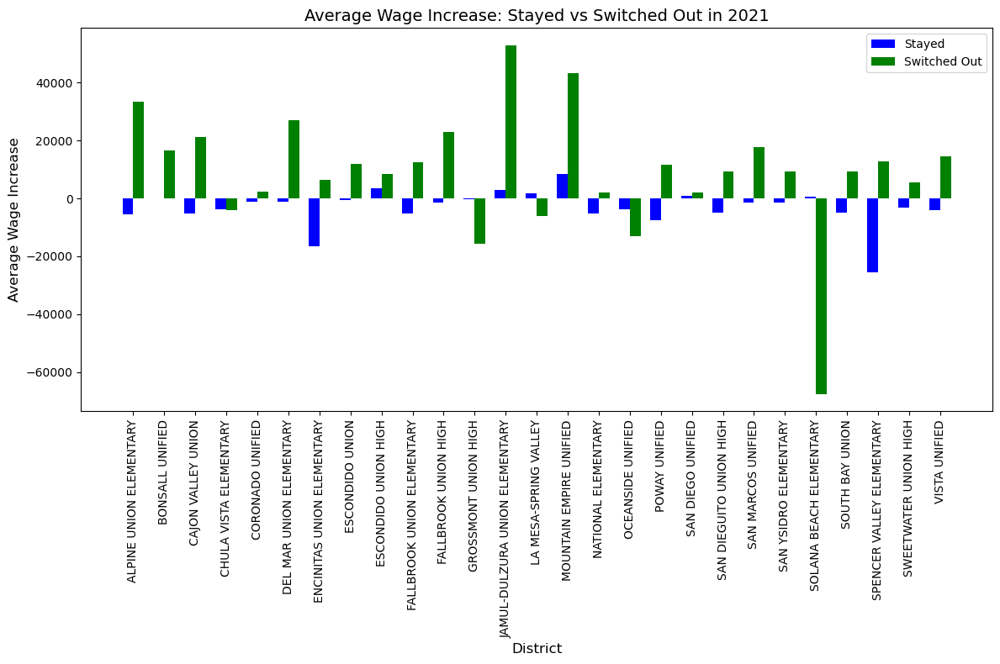

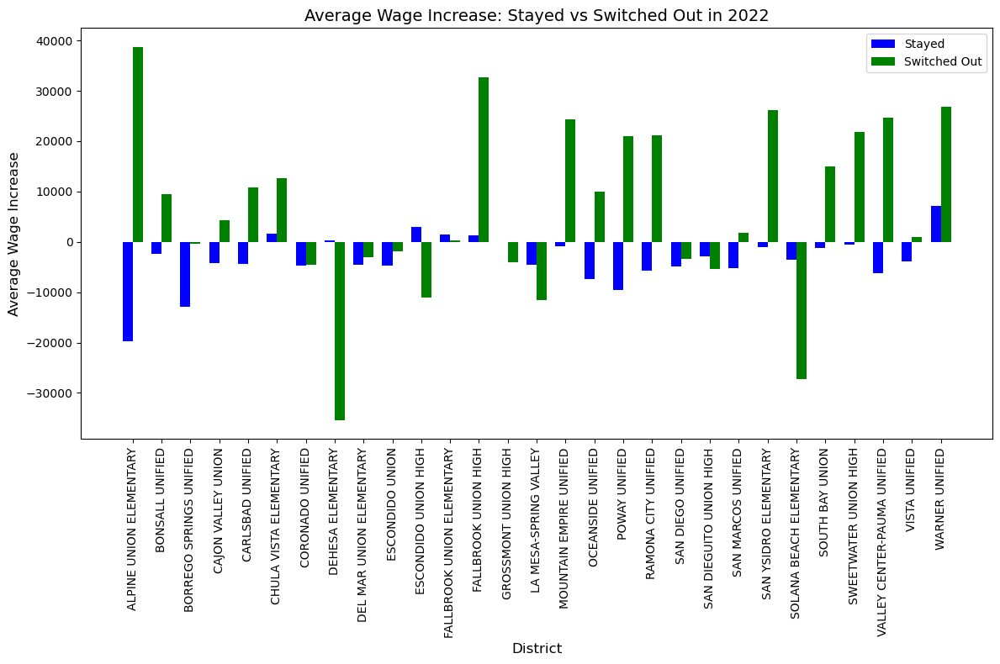

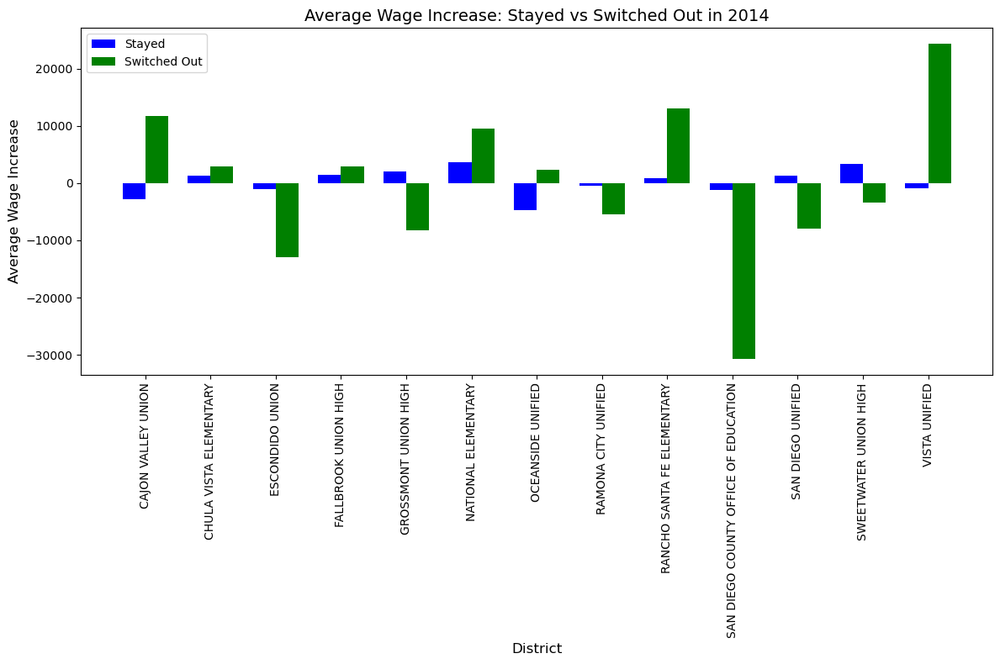

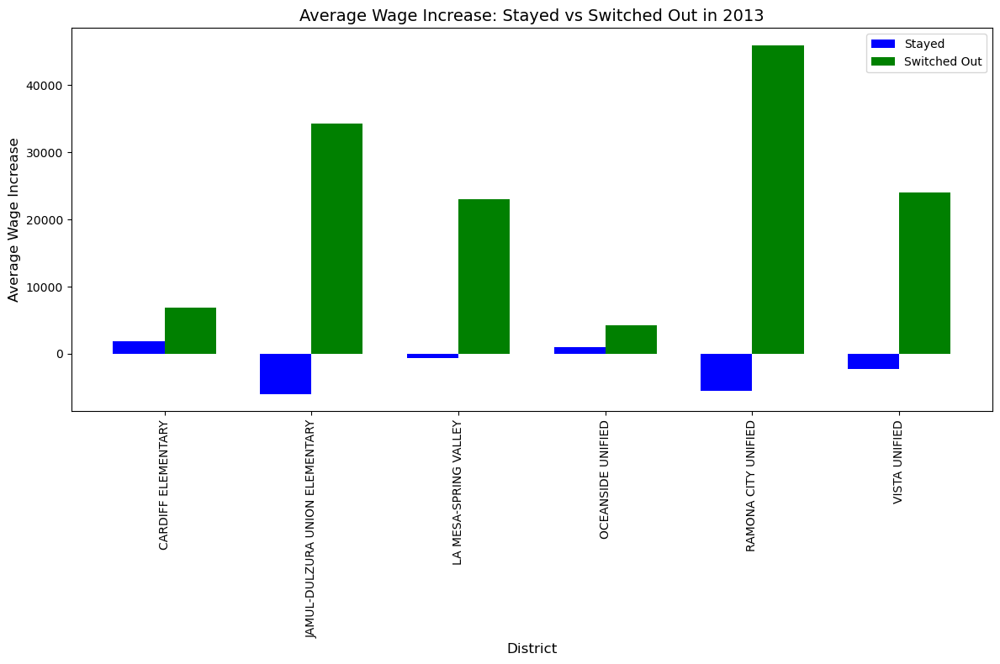

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

#Calculate wage increase for teachers who stayed in the same district
teacher_data_single_dist['previous_pay_and_benefits'] = teacher_data_single_dist['pay_and_benefits_adjusted'].shift(1)
teacher_data_single_dist['wage_increase'] = teacher_data_single_dist['pay_and_benefits_adjusted'] - teacher_data_single_dist['previous_pay_and_benefits']

# Identify teachers who stayed in the same district (no district switch)
stayed_df = teacher_data_single_dist[teacher_data_single_dist['district_switch'] == False].copy()

#Calculate the average wage increase for teachers who stayed, grouped by district and year
avg_increase_stayed = stayed_df.groupby(['dist', 'year'])['wage_increase'].mean().reset_index()
avg_increase_stayed.rename(columns={'wage_increase': 'avg_wage_increase_stayed'}, inplace=True)

# Calculate the average wage increase for teachers who switched districts (switch-out)
switch_out_df = single_switch_df.copy()  # Make sure this contains the necessary switch-out data

# Calculate wage increase for switchers
switch_out_df['wage_increase_switch_out'] = switch_out_df['new_pay_and_benefits'] - switch_out_df['previous_pay_and_benefits']

# Average wage increase for switch-outs
avg_increase_switch = switch_out_df.groupby(['previous_dist', 'year'])['wage_increase_switch_out'].mean().reset_index()
avg_increase_switch.rename(columns={'previous_dist': 'dist', 'wage_increase_switch_out': 'avg_wage_increase_switched_out'}, inplace=True)

#Merge the two DataFrames on district and year
comparison_df = pd.merge(avg_increase_stayed, avg_increase_switch, on=['dist', 'year'], how='inner')

#Generate a separate plot for each year
years = comparison_df['year'].unique()

for year in years:
    year_data = comparison_df[comparison_df['year'] == year]
    
    fig, ax = plt.subplots(figsize=(12, 8))

    bar_width = 0.35

    r1 = range(len(year_data))
    r2 = [x + bar_width for x in r1]

    ax.bar(r1, year_data['avg_wage_increase_stayed'], color='blue', width=bar_width, label='Stayed')
    ax.bar(r2, year_data['avg_wage_increase_switched_out'], color='green', width=bar_width, label='Switched Out')

    ax.set_xlabel('District', fontsize=12)
    ax.set_ylabel('Average Wage Increase', fontsize=12)
    ax.set_title(f'Average Wage Increase: Stayed vs Switched Out in {year}', fontsize=14)
    ax.set_xticks([r + bar_width / 2 for r in range(len(year_data))])
    ax.set_xticklabels(year_data['dist'], rotation=90)

    ax.legend()
    plt.tight_layout()
    plt.show()


C:\Users\khali\AppData\Local\Temp\ipykernel_10228\625829896.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teacher_data_single_dist['previous_pay_and_benefits'] = teacher_data_single_dist['pay_and_benefits_adjusted'].shift(1)
C:\Users\khali\AppData\Local\Temp\ipykernel_10228\625829896.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teacher_data_single_dist['wage_increase'] = teacher_data_single_dist['pay_and_benefits_adjusted'] - teacher_data_single_dist['previous_pay_and_benefits']


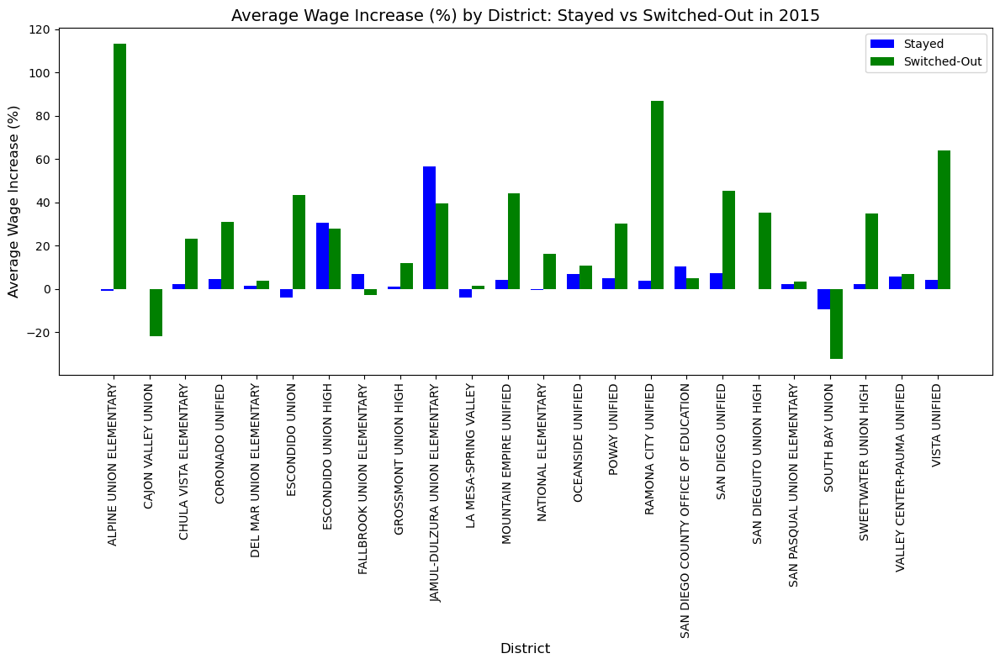

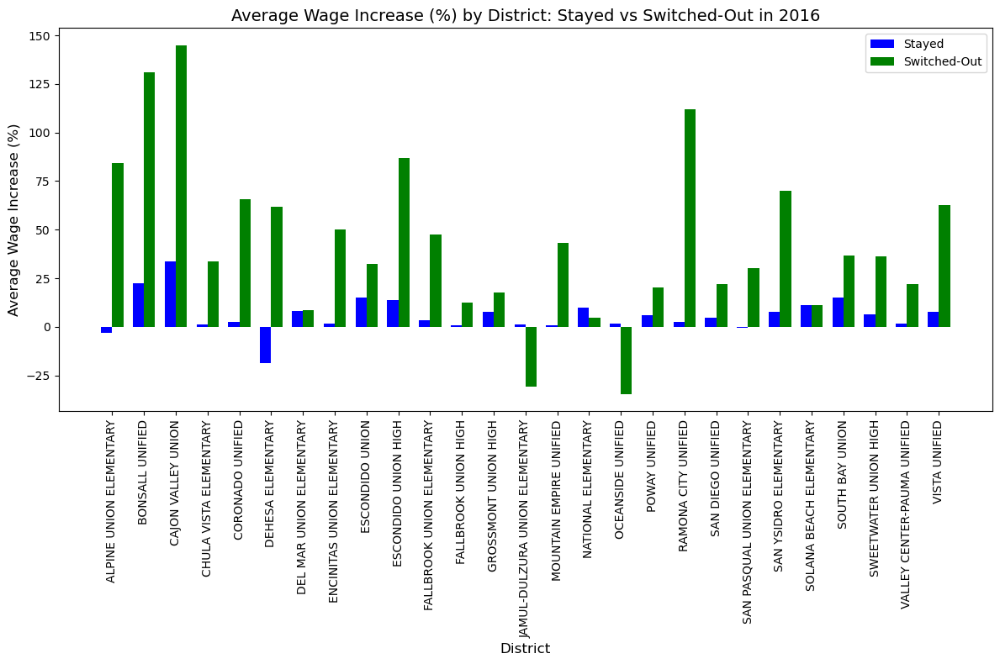

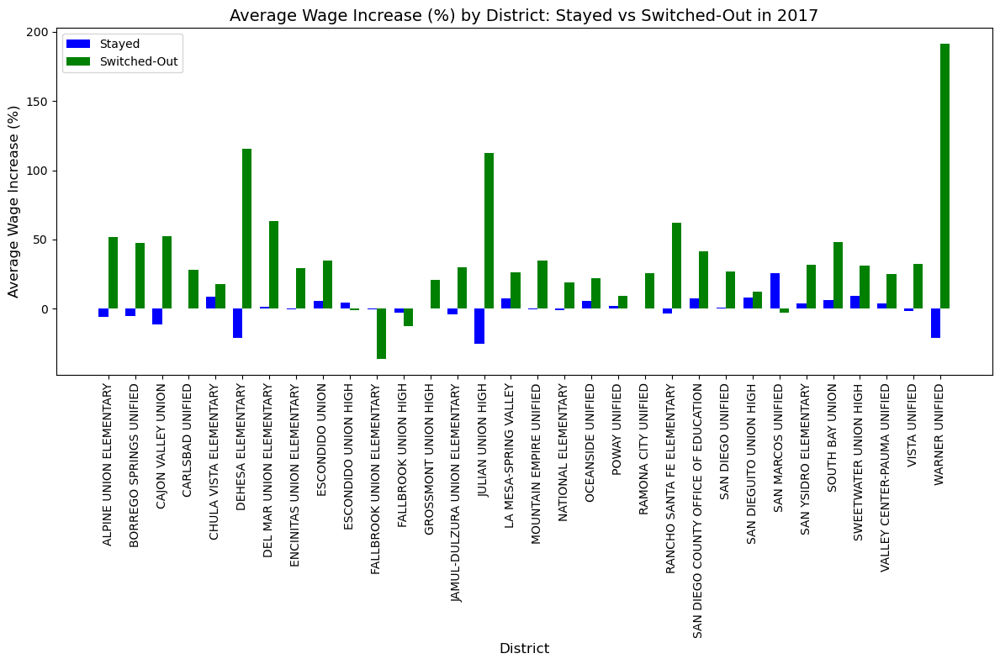

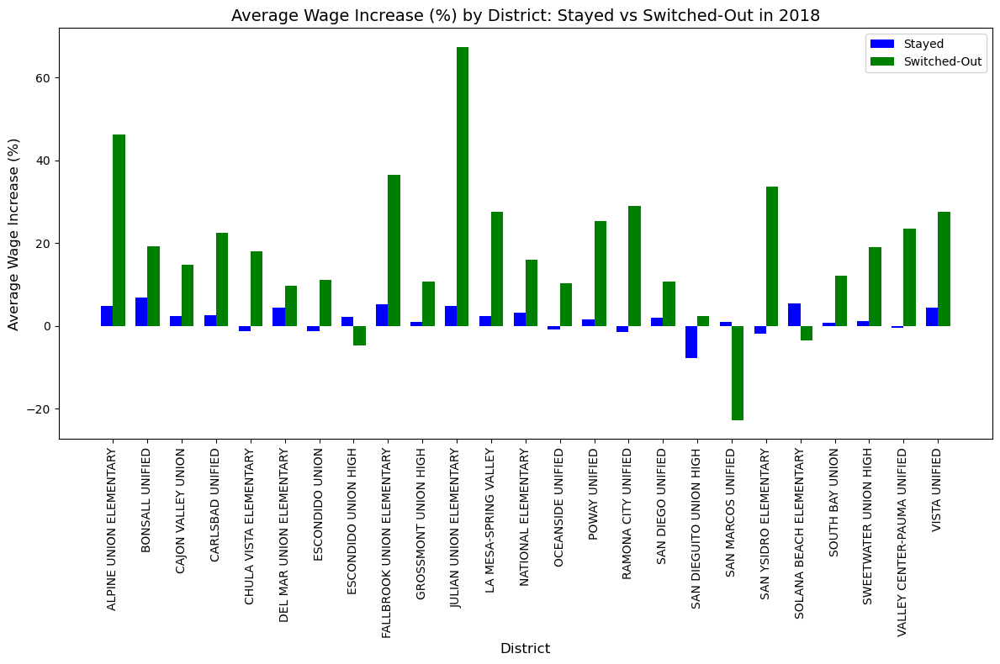

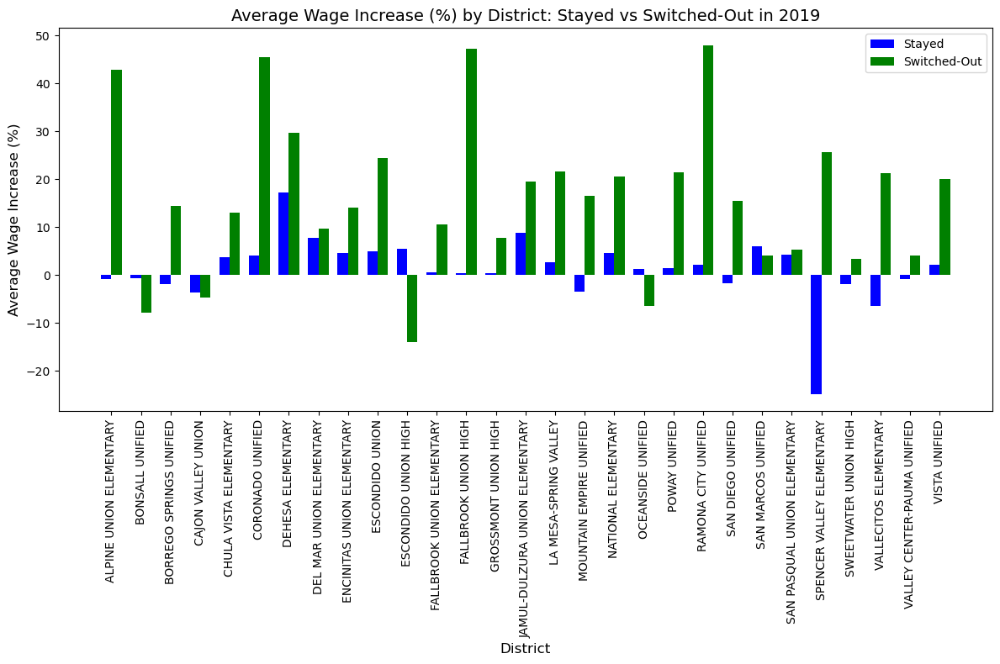

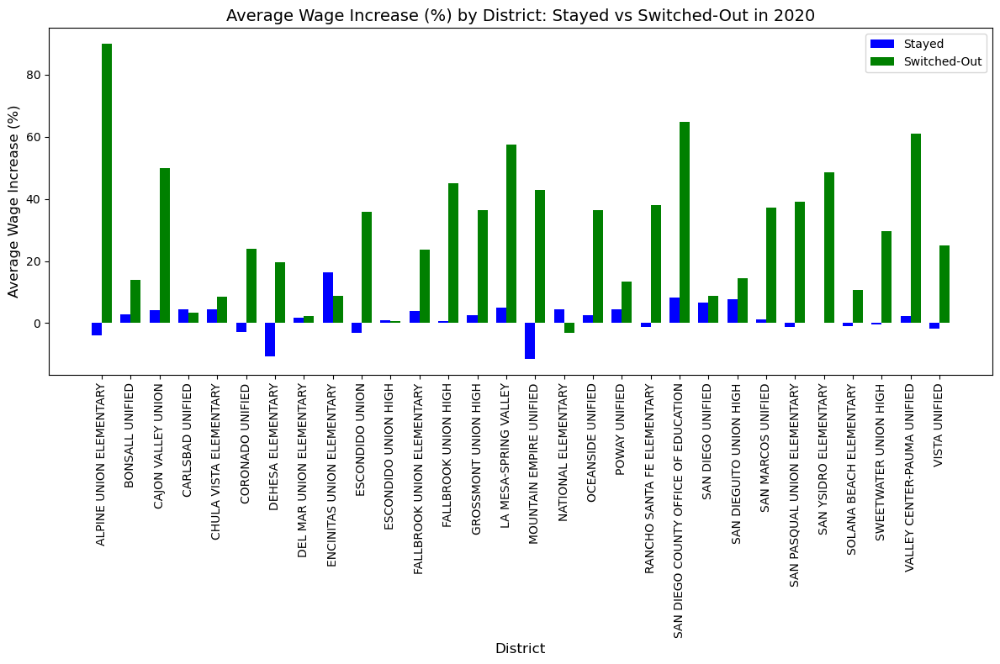

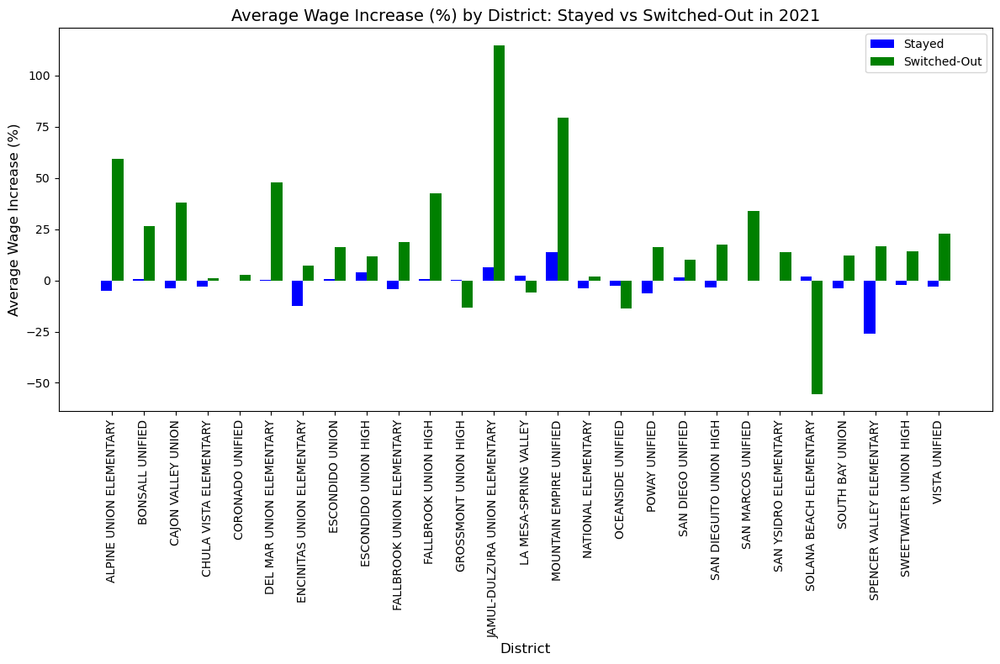

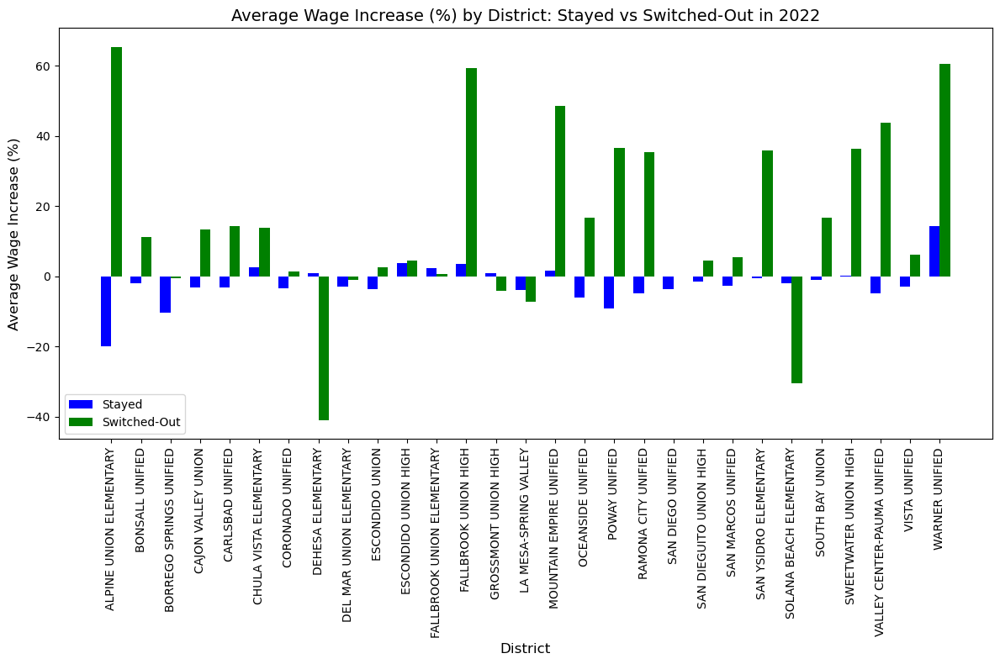

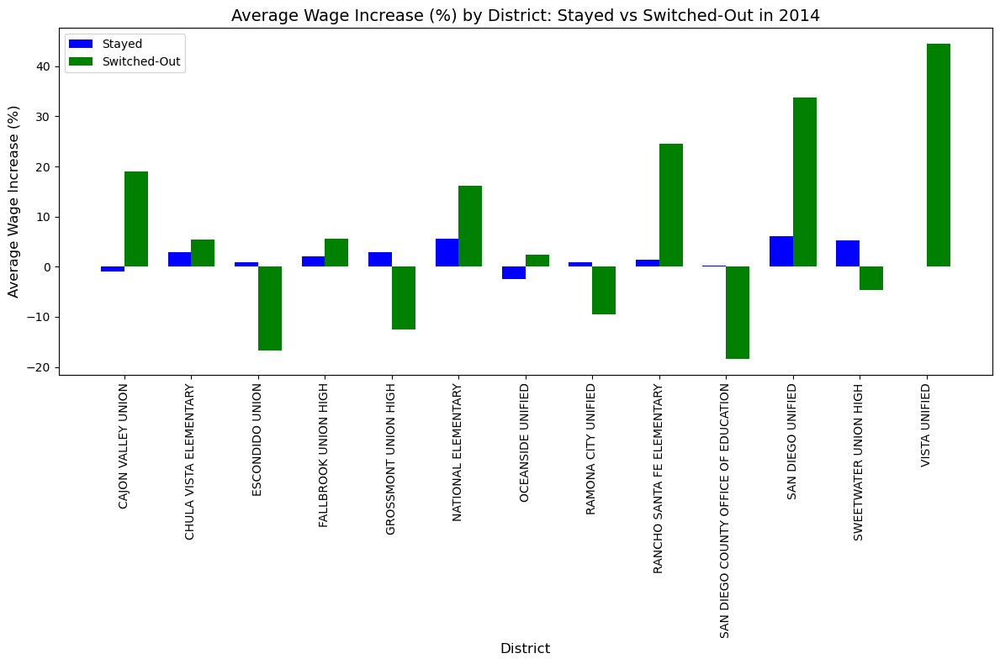

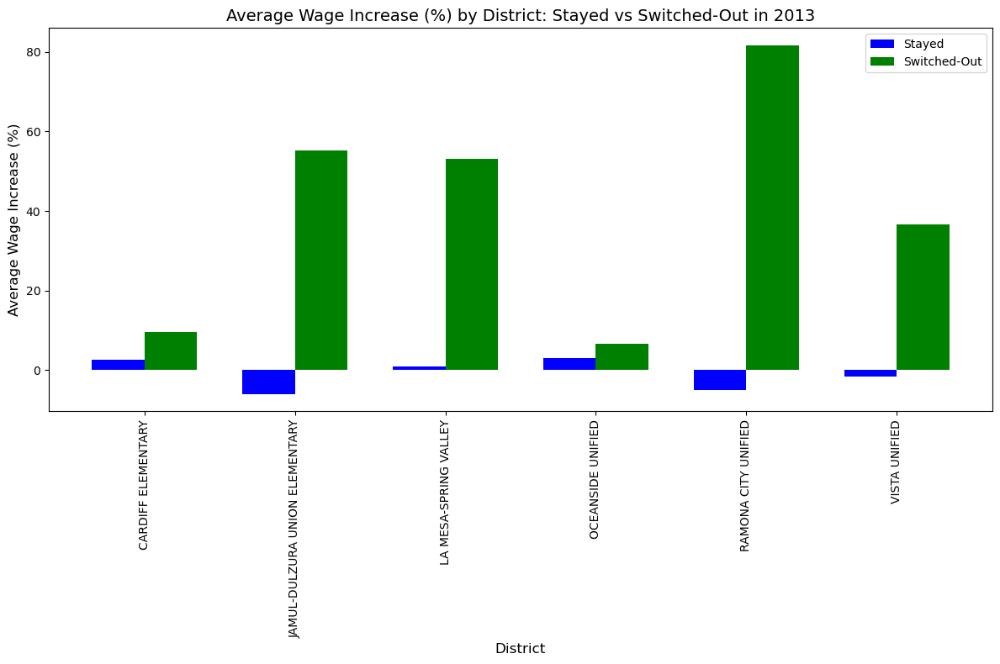

In [10]:
import pandas as pd
import matplotlib.pyplot as plt

#Calculate wage increase for teachers who stayed in the same district
teacher_data_single_dist['previous_pay_and_benefits'] = teacher_data_single_dist['pay_and_benefits_adjusted'].shift(1)
teacher_data_single_dist['wage_increase'] = teacher_data_single_dist['pay_and_benefits_adjusted'] - teacher_data_single_dist['previous_pay_and_benefits']

# Identify teachers who stayed in the same district (no district switch)
stayed_df = teacher_data_single_dist[teacher_data_single_dist['district_switch'] == False].copy()

#Calculate the average wage increase percentage for teachers who stayed, grouped by district and year
stayed_df['wage_increase_percentage'] = (stayed_df['wage_increase'] / stayed_df['previous_pay_and_benefits']) * 100
avg_increase_stayed = stayed_df.groupby(['dist', 'year'])['wage_increase_percentage'].mean().reset_index()
avg_increase_stayed.rename(columns={'wage_increase_percentage': 'avg_wage_increase_stayed'}, inplace=True)

#Calculate the average wage increase percentage for teachers who switched districts (switch-out)
single_switch_df['switch_wage_increase_percentage'] = (
    (single_switch_df['new_pay_and_benefits'] - single_switch_df['previous_pay_and_benefits']) /
    single_switch_df['previous_pay_and_benefits'] * 100
)
avg_increase_switch = single_switch_df.groupby(['previous_dist', 'year'])['switch_wage_increase_percentage'].mean().reset_index()
avg_increase_switch.rename(columns={'switch_wage_increase_percentage': 'avg_wage_increase_switched', 'previous_dist': 'dist'}, inplace=True)

#Merge the two DataFrames on district and year
comparison_df = pd.merge(avg_increase_stayed, avg_increase_switch, on=['dist', 'year'], how='inner')

#Generate a separate plot for each year
years = comparison_df['year'].unique()

for year in years:
    # Filter data for the specific year
    year_data = comparison_df[comparison_df['year'] == year]
    
    # Plotting side-by-side comparison for the year
    fig, ax = plt.subplots(figsize=(12, 8))

    bar_width = 0.35

    r1 = range(len(year_data))
    r2 = [x + bar_width for x in r1]

    
    ax.bar(r1, year_data['avg_wage_increase_stayed'], color='blue', width=bar_width, label='Stayed')
    ax.bar(r2, year_data['avg_wage_increase_switched'], color='green', width=bar_width, label='Switched-Out')

    ax.set_xlabel('District', fontsize=12)
    ax.set_ylabel('Average Wage Increase (%)', fontsize=12)
    ax.set_title(f'Average Wage Increase (%) by District: Stayed vs Switched-Out in {year}', fontsize=14)
    ax.set_xticks([r + bar_width / 2 for r in range(len(year_data))])
    ax.set_xticklabels(year_data['dist'], rotation=90)

    ax.legend()
    plt.tight_layout()
    plt.show()



## Average wage comparison of switchers to current teachers (Switch into district)

C:\Users\khali\AppData\Local\Temp\ipykernel_10228\3938113274.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stayers_df['previous_year_pay'] = stayers_df.groupby(['name', 'dist'])['pay_and_benefits_adjusted'].shift(1)
C:\Users\khali\AppData\Local\Temp\ipykernel_10228\3938113274.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stayers_df['wage_increase_stayers'] = stayers_df['pay_and_benefits_adjusted'] - stayers_df['previous_year_pay']


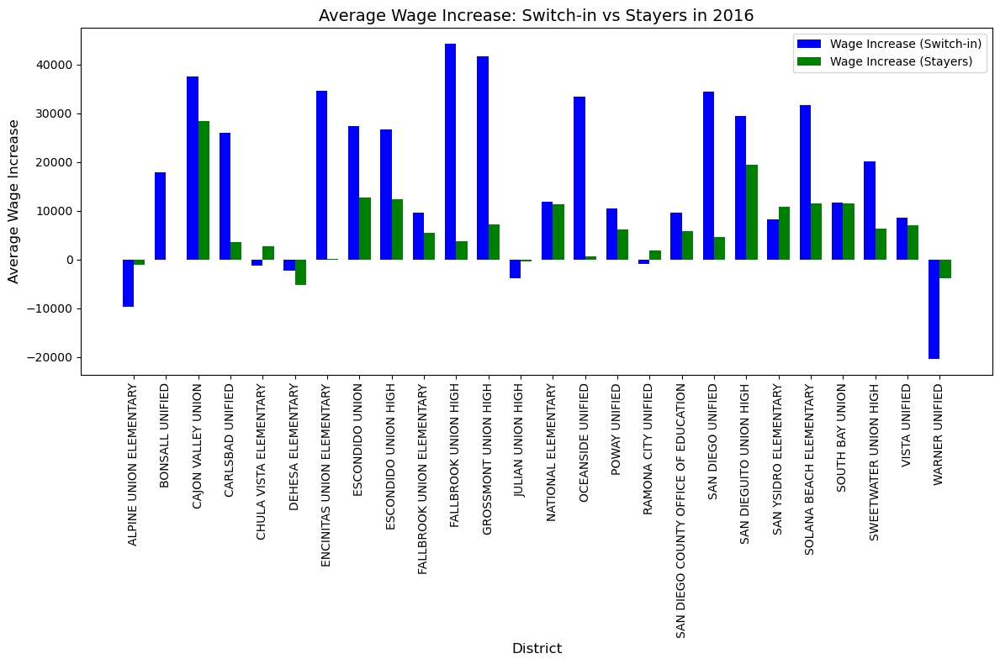

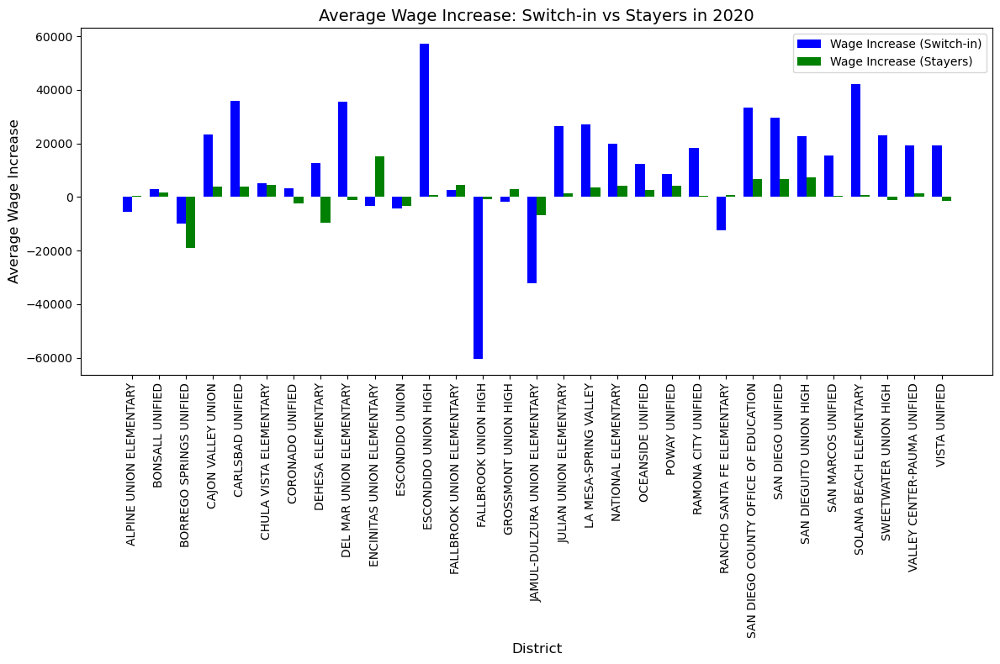

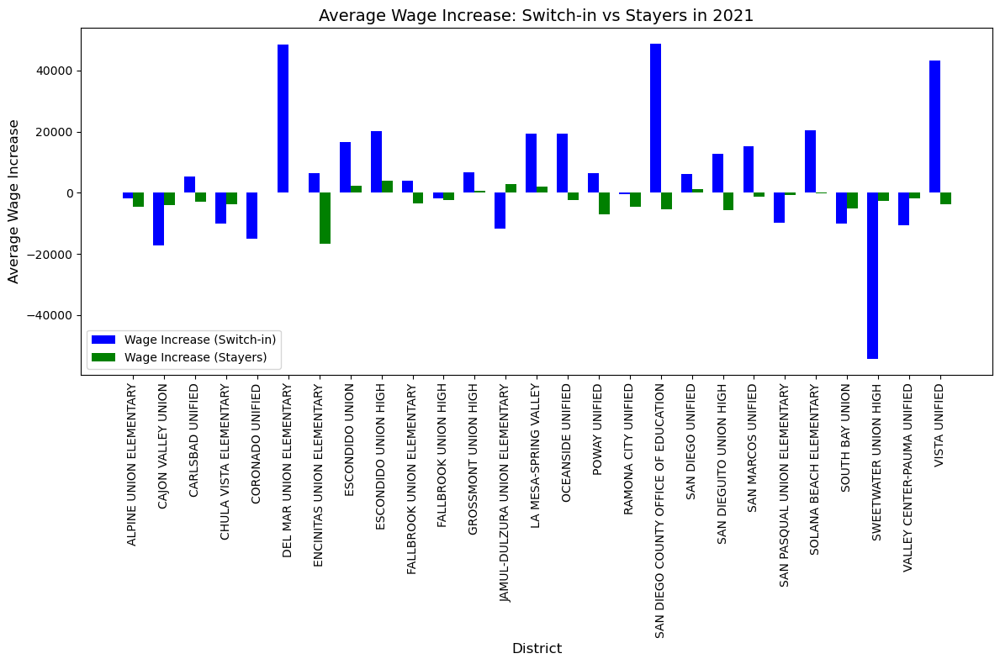

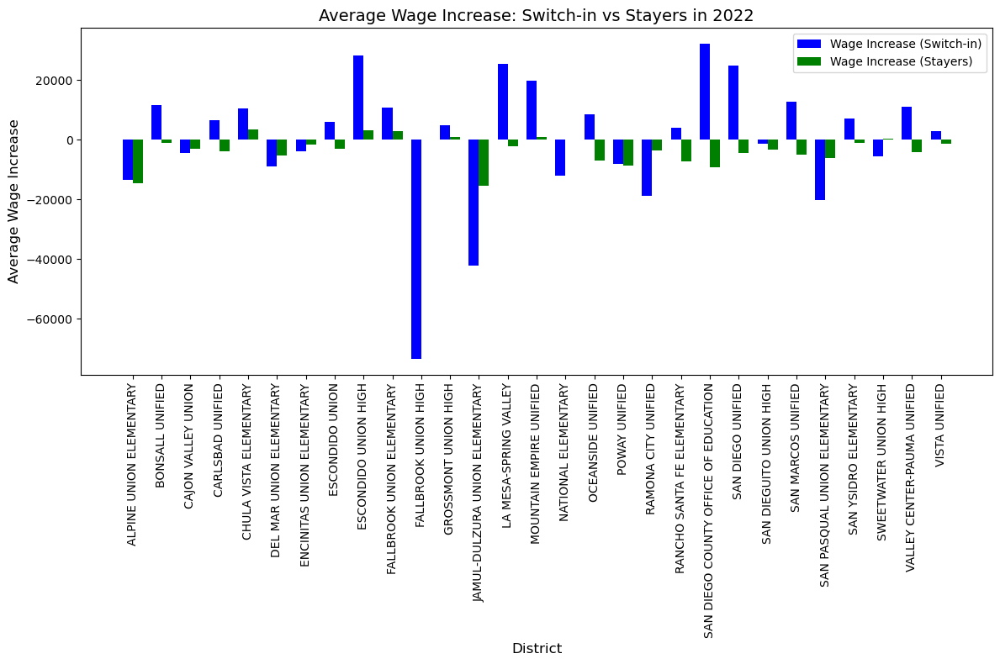

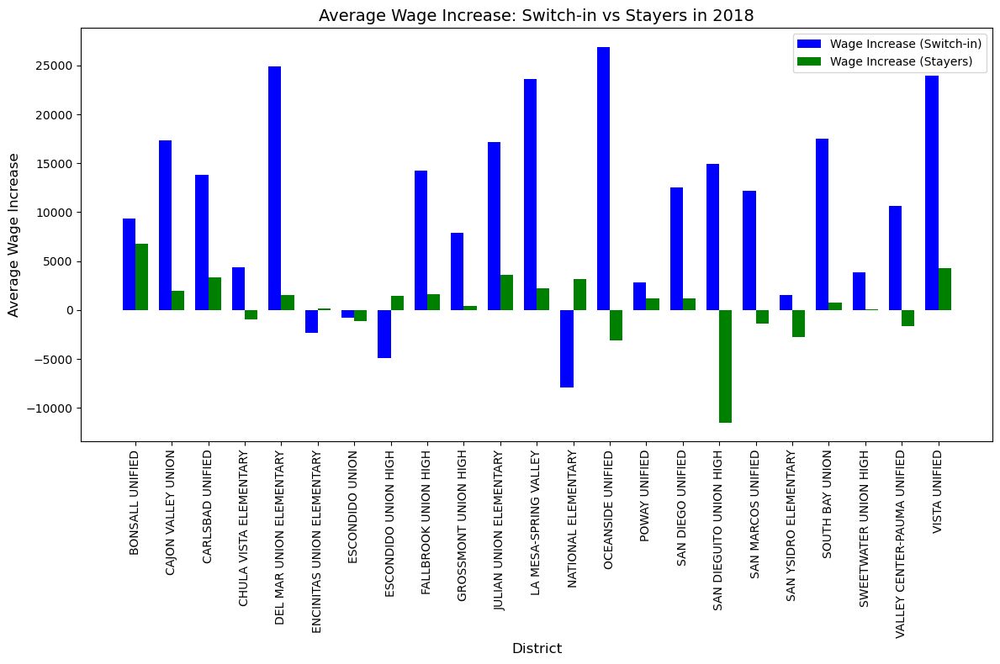

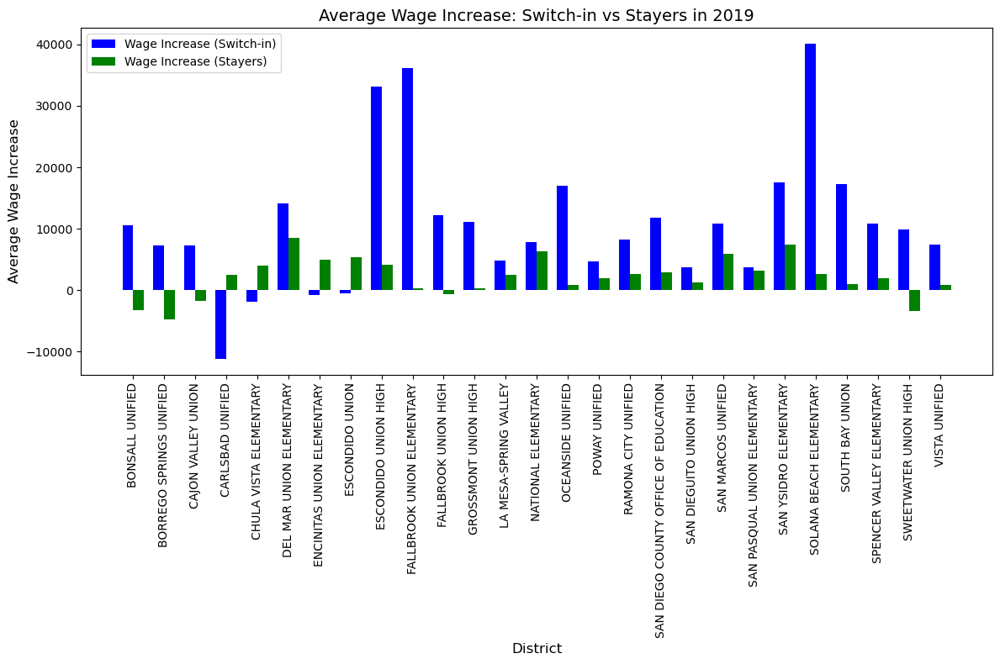

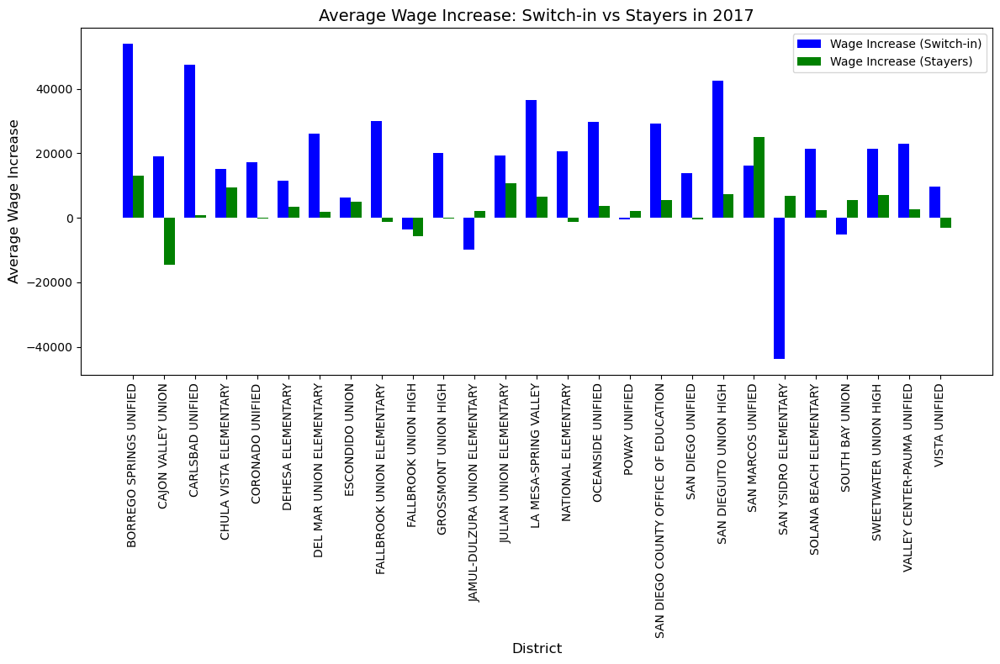

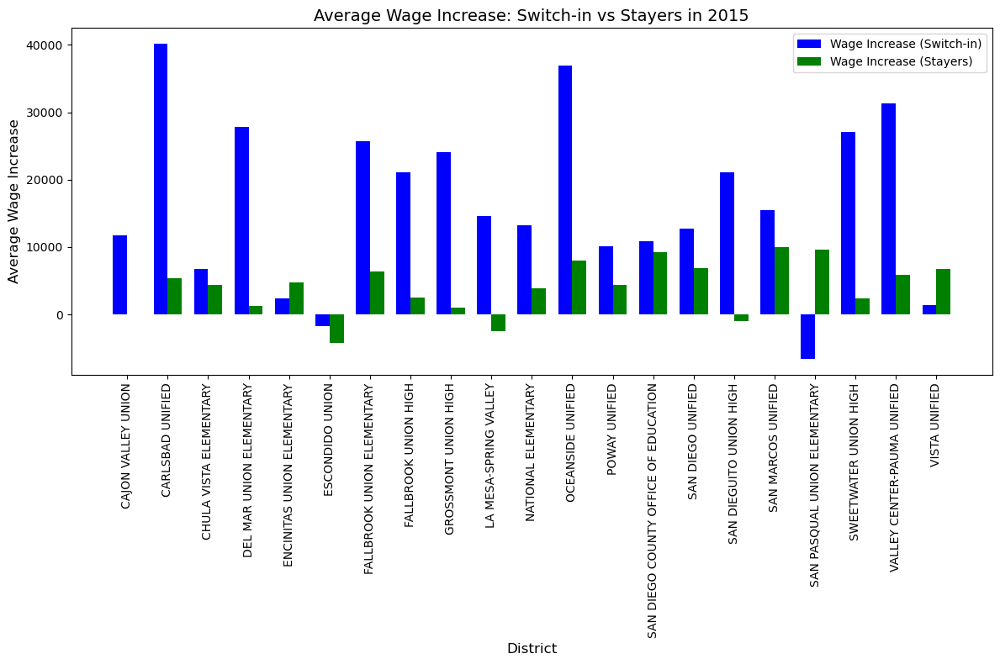

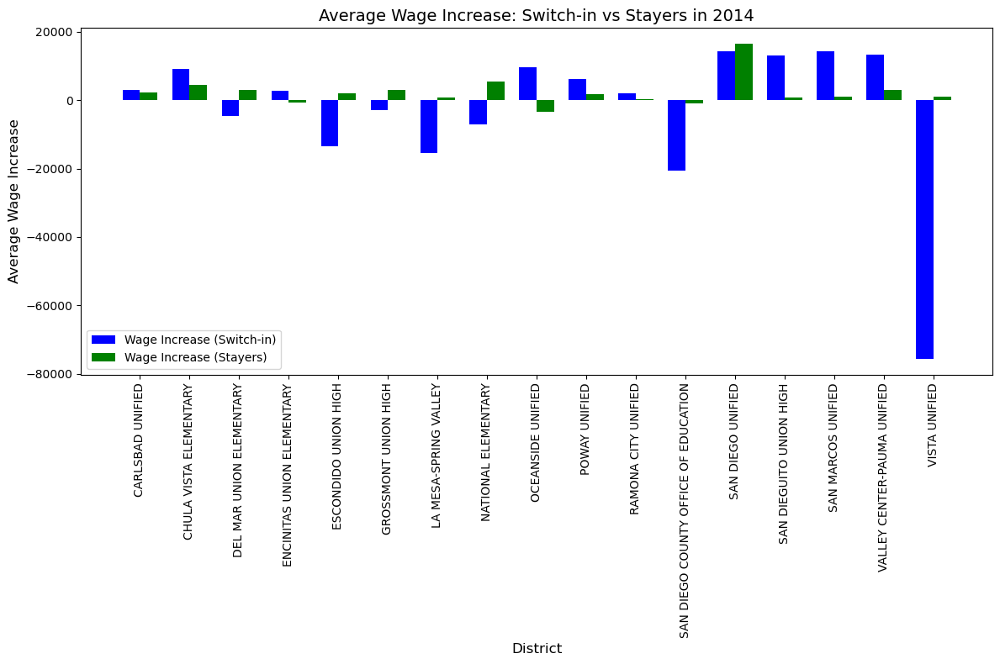

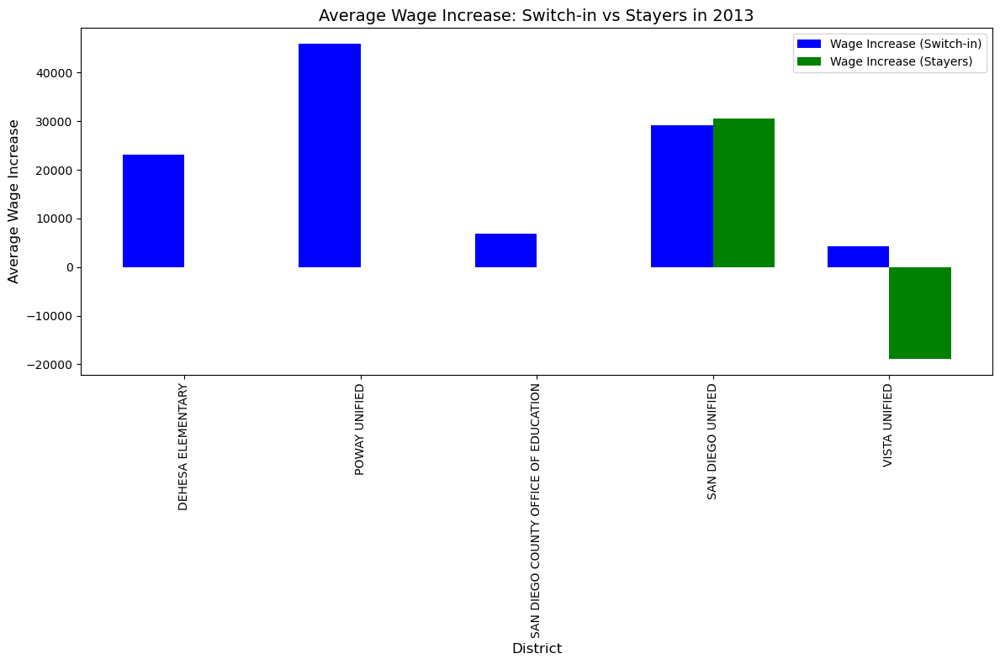

In [11]:
#Calculate the wage increase for "stayers"
# Stayers are those who worked in the same district for the previous and current year
stayers_df = teacher_data_single_dist[
    (teacher_data_single_dist['dist'] == teacher_data_single_dist['dist'].shift(1)) & 
    (teacher_data_single_dist['name'] == teacher_data_single_dist['name'].shift(1))
]

# Calculate the wage increase for stayers (difference between current and previous year's pay)
stayers_df['previous_year_pay'] = stayers_df.groupby(['name', 'dist'])['pay_and_benefits_adjusted'].shift(1)
stayers_df['wage_increase_stayers'] = stayers_df['pay_and_benefits_adjusted'] - stayers_df['previous_year_pay']

#Filter switchers (people who switched into a new district in a given year)
# These are the teachers who entered a new district in the current year
switch_in_df = single_switch_df.copy()

#Calculate the wage increase for switchers (difference between new and previous pay)
switch_in_df['wage_increase_switch_in'] = switch_in_df['new_pay_and_benefits'] - switch_in_df['previous_pay_and_benefits']

#Calculate the average wage increase for stayers and switchers per district and year
avg_increase_stayers = stayers_df.groupby(['dist', 'year'])['wage_increase_stayers'].mean().reset_index()
avg_increase_stayers.rename(columns={'dist': 'district', 'wage_increase_stayers': 'avg_wage_increase_stayers'}, inplace=True)

avg_increase_switch_in = switch_in_df.groupby(['new_dist', 'year'])['wage_increase_switch_in'].mean().reset_index()
avg_increase_switch_in.rename(columns={'new_dist': 'district', 'wage_increase_switch_in': 'avg_wage_increase_switch_in'}, inplace=True)

#Merge the average wage increase for stayers and switchers
comparison_df = pd.merge(avg_increase_stayers, avg_increase_switch_in, on=['district', 'year'], how='inner')

#Generate side-by-side bar charts for each year
years = comparison_df['year'].unique()

for year in years:
    
    year_data = comparison_df[comparison_df['year'] == year]

    fig, ax = plt.subplots(figsize=(12, 8))

    bar_width = 0.35

    r1 = range(len(year_data))
    r2 = [x + bar_width for x in r1]

    ax.bar(r1, year_data['avg_wage_increase_switch_in'], color='blue', width=bar_width, label='Wage Increase (Switch-in)')
    ax.bar(r2, year_data['avg_wage_increase_stayers'], color='green', width=bar_width, label='Wage Increase (Stayers)')

    ax.set_xlabel('District', fontsize=12)
    ax.set_ylabel('Average Wage Increase', fontsize=12)
    ax.set_title(f'Average Wage Increase: Switch-in vs Stayers in {year}', fontsize=14)
    ax.set_xticks([r + bar_width / 2 for r in range(len(year_data))])
    ax.set_xticklabels(year_data['district'], rotation=90)

    ax.legend()
    plt.tight_layout()
    plt.show()

C:\Users\khali\AppData\Local\Temp\ipykernel_10228\3049833999.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stayers_df['previous_year_pay'] = stayers_df.groupby(['name', 'dist'])['pay_and_benefits_adjusted'].shift(1)
C:\Users\khali\AppData\Local\Temp\ipykernel_10228\3049833999.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stayers_df['wage_increase_stayers'] = stayers_df['pay_and_benefits_adjusted'] - stayers_df['previous_year_pay']
C:\Users\khali\AppData\Local\Temp\ipykernel_10228\3049833999.py

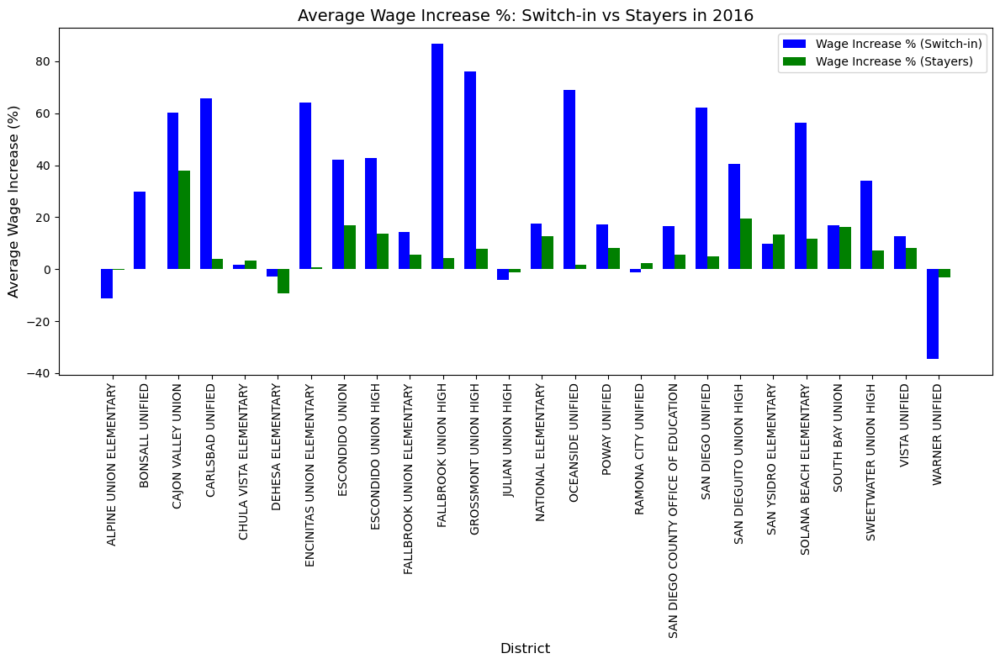

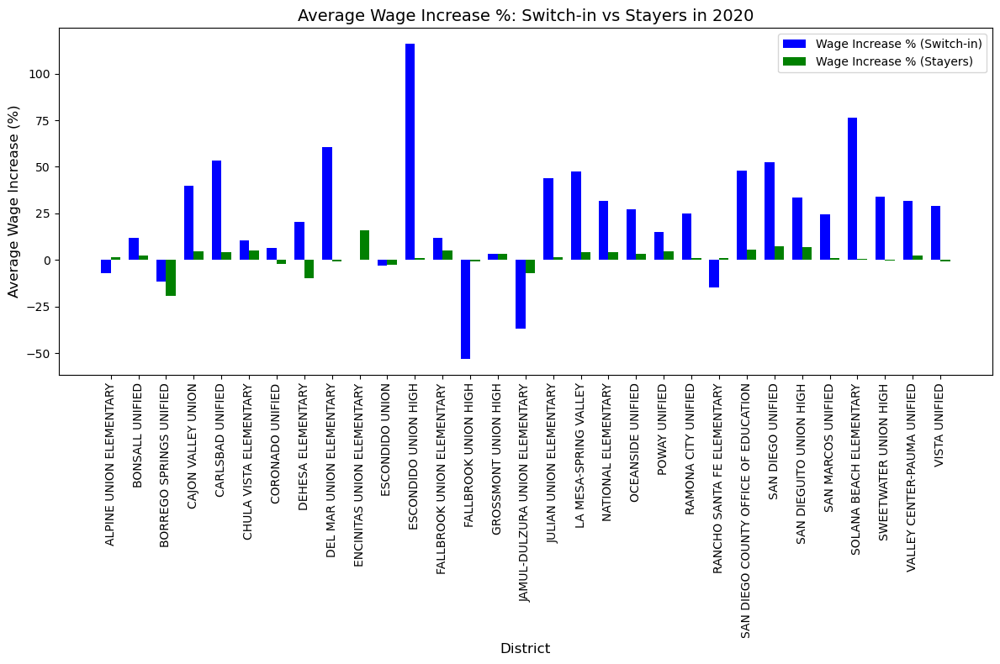

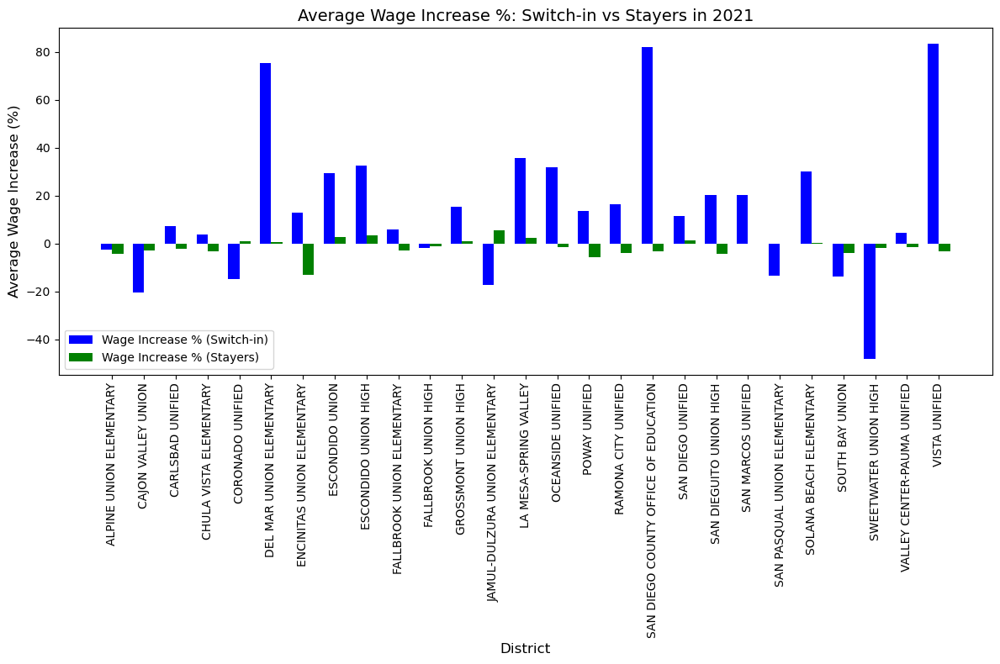

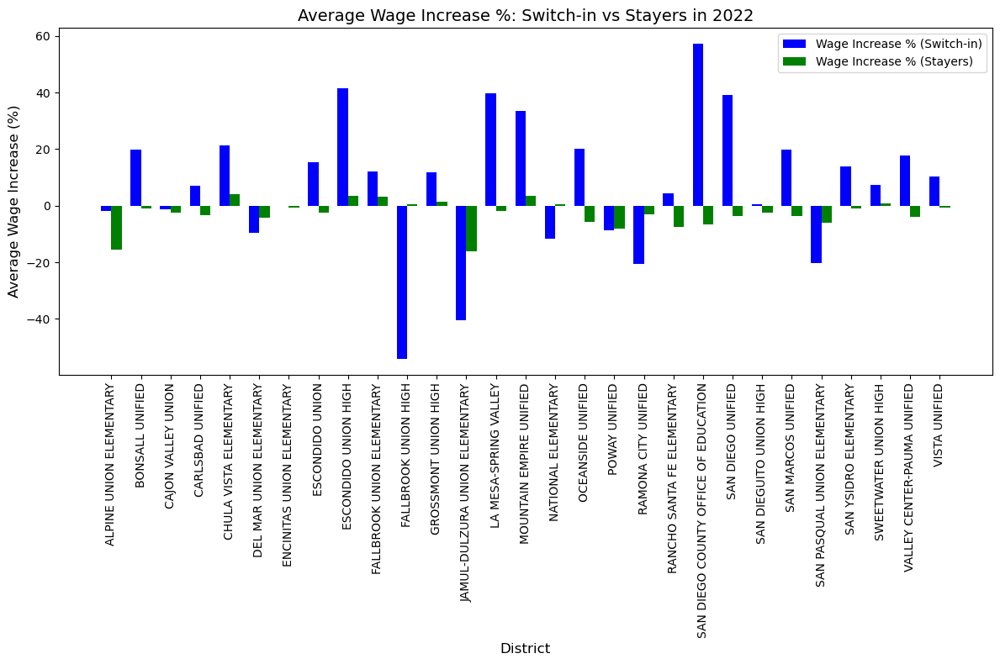

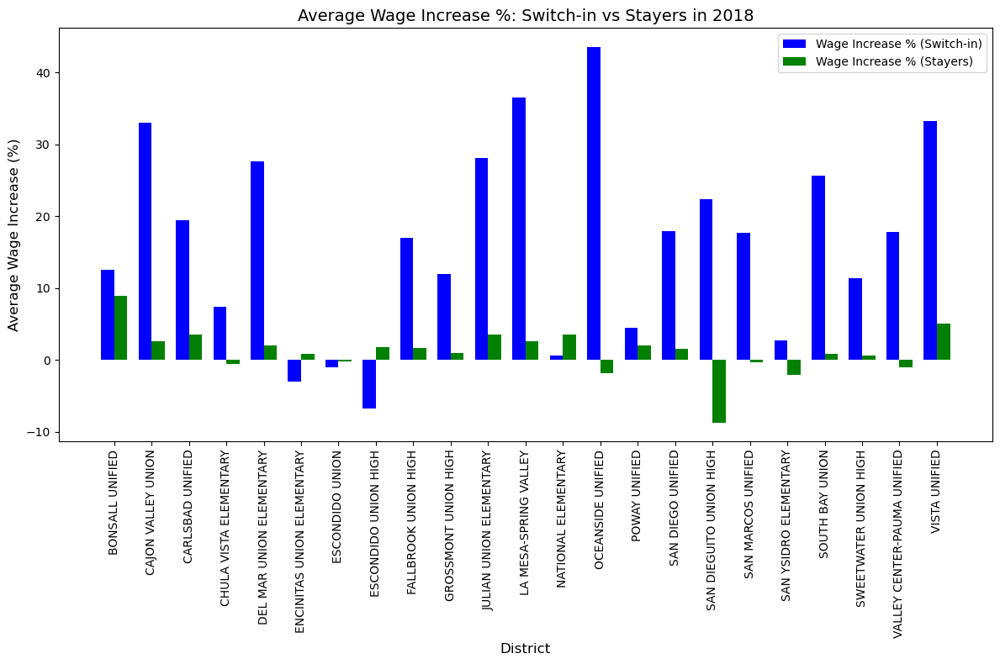

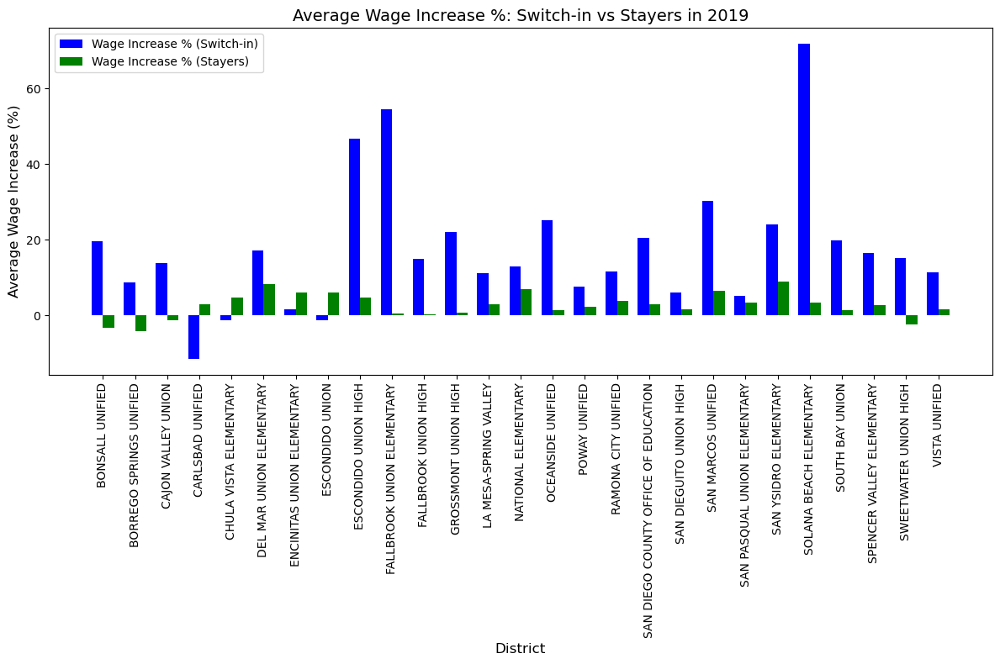

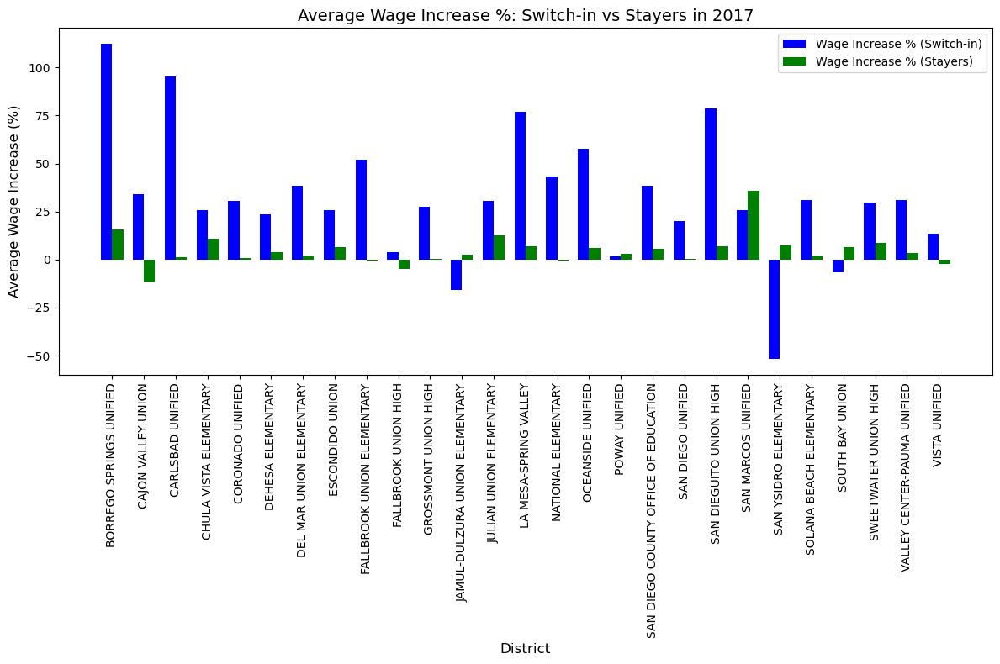

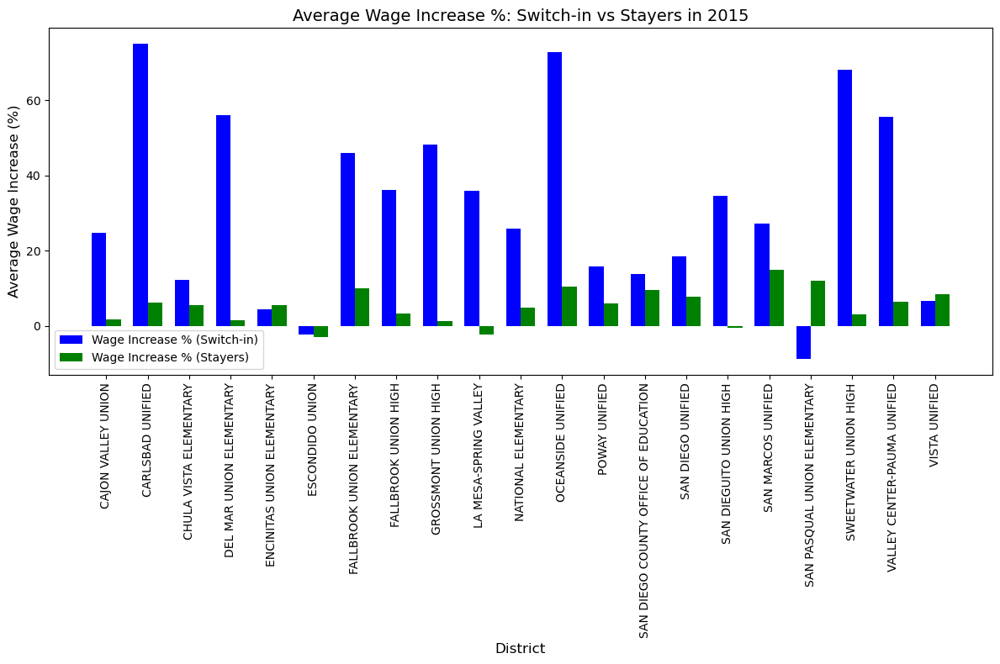

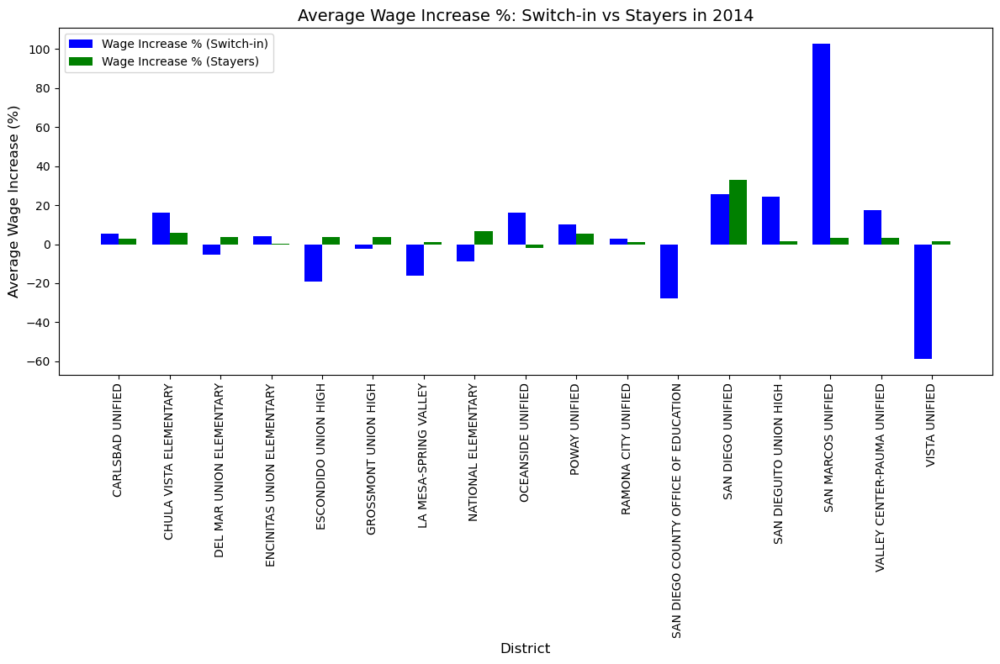

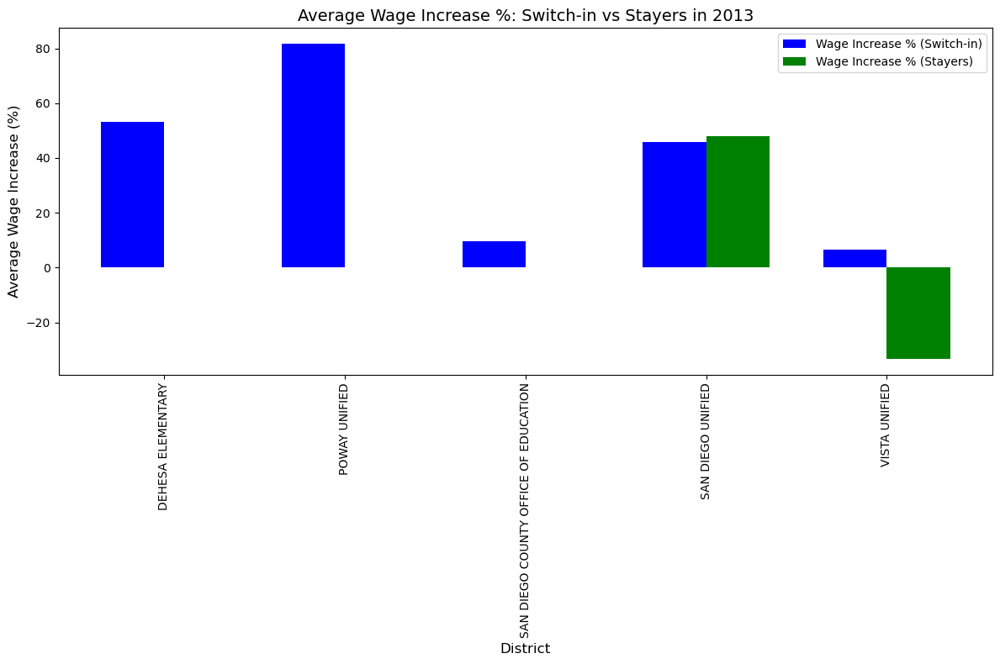

In [12]:
import pandas as pd
import matplotlib.pyplot as plt

#Calculate the wage increase for "stayers"
# Stayers are those who worked in the same district for the previous and current year
stayers_df = teacher_data_single_dist[
    (teacher_data_single_dist['dist'] == teacher_data_single_dist['dist'].shift(1)) & 
    (teacher_data_single_dist['name'] == teacher_data_single_dist['name'].shift(1))
]

# Calculate the wage increase for stayers (difference between current and previous year's pay)
stayers_df['previous_year_pay'] = stayers_df.groupby(['name', 'dist'])['pay_and_benefits_adjusted'].shift(1)
stayers_df['wage_increase_stayers'] = stayers_df['pay_and_benefits_adjusted'] - stayers_df['previous_year_pay']

# Calculate percentage increase for stayers
stayers_df['wage_increase_percentage_stayers'] = (stayers_df['wage_increase_stayers'] / stayers_df['previous_year_pay']) * 100

# Filter switchers (people who switched into a new district in a given year)
# These are the teachers who entered a new district in the current year
switch_in_df = single_switch_df.copy()

#Calculate the wage increase for switchers (difference between new and previous pay)
switch_in_df['wage_increase_switch_in'] = switch_in_df['new_pay_and_benefits'] - switch_in_df['previous_pay_and_benefits']

# Calculate percentage increase for switchers
switch_in_df['wage_increase_percentage_switch_in'] = (
    (switch_in_df['wage_increase_switch_in'] / switch_in_df['previous_pay_and_benefits']) * 100
)

#Calculate the average wage increase percentage for stayers and switchers per district and year
avg_increase_stayers = stayers_df.groupby(['dist', 'year'])['wage_increase_percentage_stayers'].mean().reset_index()
avg_increase_stayers.rename(columns={'dist': 'district', 'wage_increase_percentage_stayers': 'avg_wage_increase_stayers'}, inplace=True)

avg_increase_switch_in = switch_in_df.groupby(['new_dist', 'year'])['wage_increase_percentage_switch_in'].mean().reset_index()
avg_increase_switch_in.rename(columns={'new_dist': 'district', 'wage_increase_percentage_switch_in': 'avg_wage_increase_switch_in'}, inplace=True)

#Merge the average wage increase for stayers and switchers
comparison_df = pd.merge(avg_increase_stayers, avg_increase_switch_in, on=['district', 'year'], how='inner')

#Generate side-by-side bar charts for each year
years = comparison_df['year'].unique()

for year in years:
    year_data = comparison_df[comparison_df['year'] == year]

    fig, ax = plt.subplots(figsize=(12, 8))

    bar_width = 0.35

    r1 = range(len(year_data))
    r2 = [x + bar_width for x in r1]

    ax.bar(r1, year_data['avg_wage_increase_switch_in'], color='blue', width=bar_width, label='Wage Increase % (Switch-in)')
    ax.bar(r2, year_data['avg_wage_increase_stayers'], color='green', width=bar_width, label='Wage Increase % (Stayers)')

    ax.set_xlabel('District', fontsize=12)
    ax.set_ylabel('Average Wage Increase (%)', fontsize=12)
    ax.set_title(f'Average Wage Increase %: Switch-in vs Stayers in {year}', fontsize=14)
    ax.set_xticks([r + bar_width / 2 for r in range(len(year_data))])
    ax.set_xticklabels(year_data['district'], rotation=90)

    ax.legend()
    plt.tight_layout()
    plt.show()



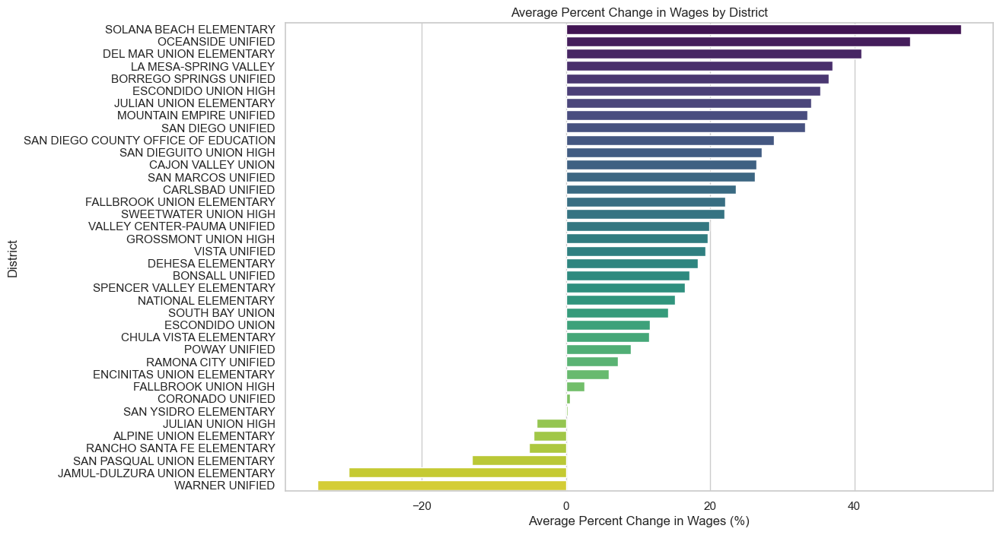

In [13]:
# Calculate the percent change in wages for each switch
single_switch_df['percent_change_wages'] = ((single_switch_df['new_pay_and_benefits'] - single_switch_df['previous_pay_and_benefits']) / single_switch_df['previous_pay_and_benefits']) * 100
# Group by new district and calculate the average percent change in wages
average_percent_change = single_switch_df.groupby('new_dist')['percent_change_wages'].mean().reset_index()

# Rename columns for clarity
average_percent_change.columns = ['District', 'Average Percent Change in Wages']

# Sort the districts by average percent change
average_percent_change.sort_values(by='Average Percent Change in Wages', ascending=False, inplace=True)

import matplotlib.pyplot as plt
import seaborn as sns


sns.set(style="whitegrid")


plt.figure(figsize=(12, 8))
sns.barplot(x='Average Percent Change in Wages', y='District', data=average_percent_change, palette='viridis')

plt.xlabel('Average Percent Change in Wages (%)')
plt.ylabel('District')
plt.title('Average Percent Change in Wages by District')

plt.show()


C:\Users\khali\AppData\Local\Temp\ipykernel_10228\1719429861.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subject_data.sort_values(by='percent_change_wages', ascending=False, inplace=True)


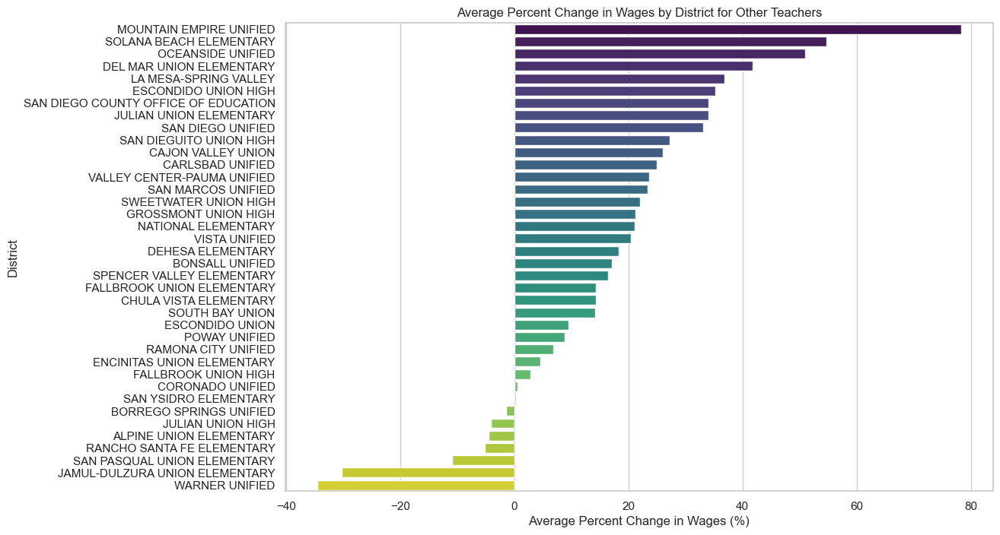

C:\Users\khali\AppData\Local\Temp\ipykernel_10228\1719429861.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subject_data.sort_values(by='percent_change_wages', ascending=False, inplace=True)


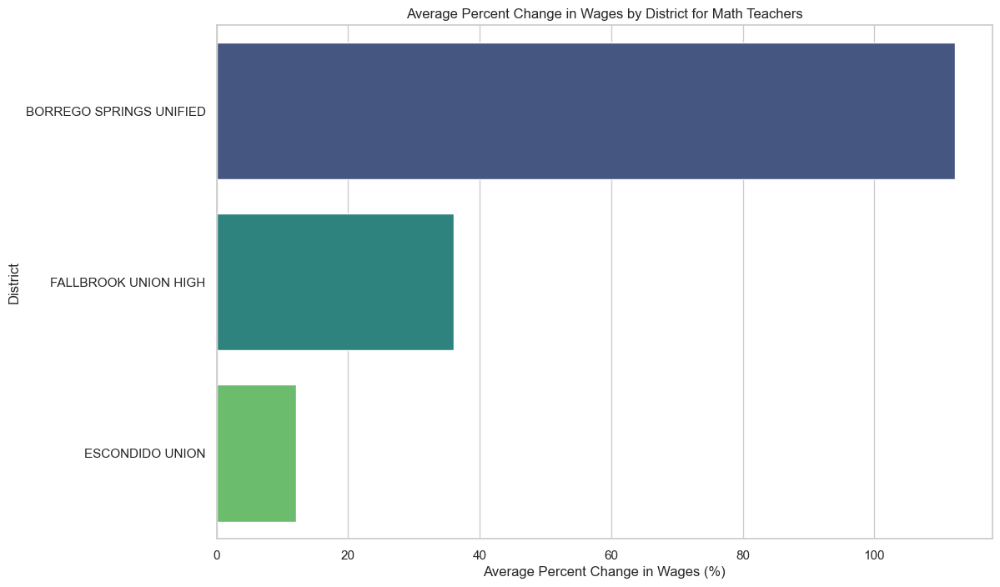

C:\Users\khali\AppData\Local\Temp\ipykernel_10228\1719429861.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subject_data.sort_values(by='percent_change_wages', ascending=False, inplace=True)


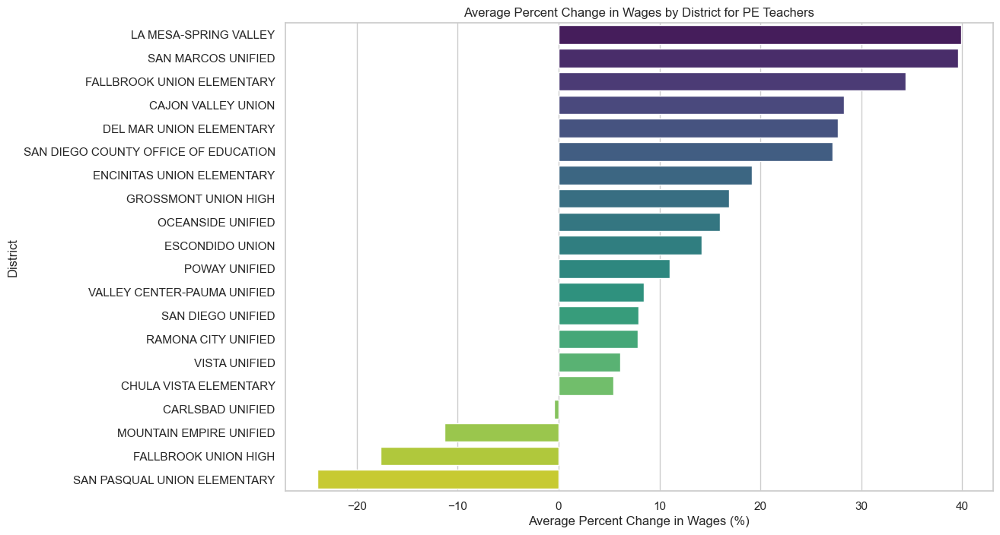

C:\Users\khali\AppData\Local\Temp\ipykernel_10228\1719429861.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subject_data.sort_values(by='percent_change_wages', ascending=False, inplace=True)


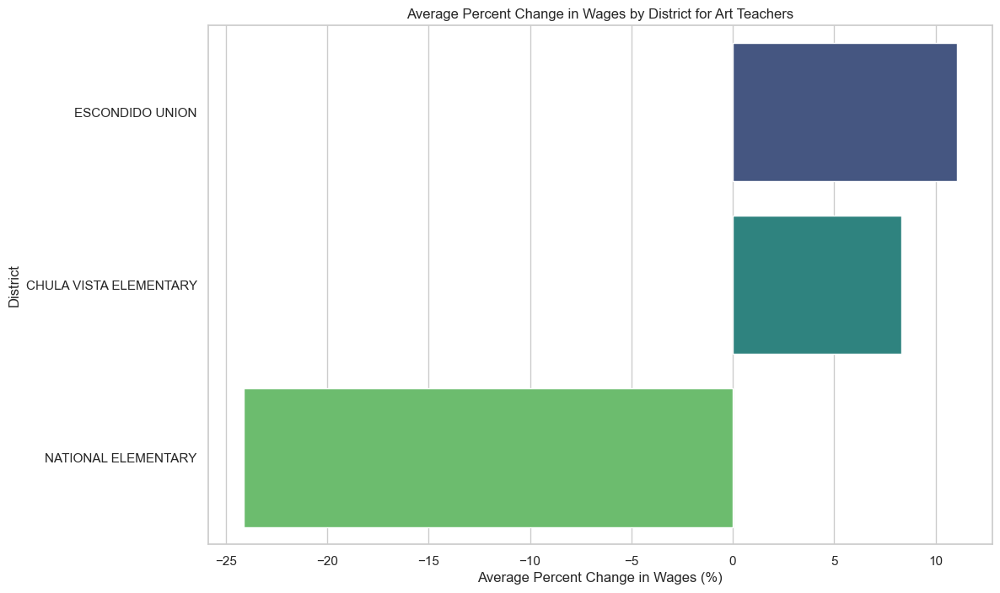

C:\Users\khali\AppData\Local\Temp\ipykernel_10228\1719429861.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subject_data.sort_values(by='percent_change_wages', ascending=False, inplace=True)


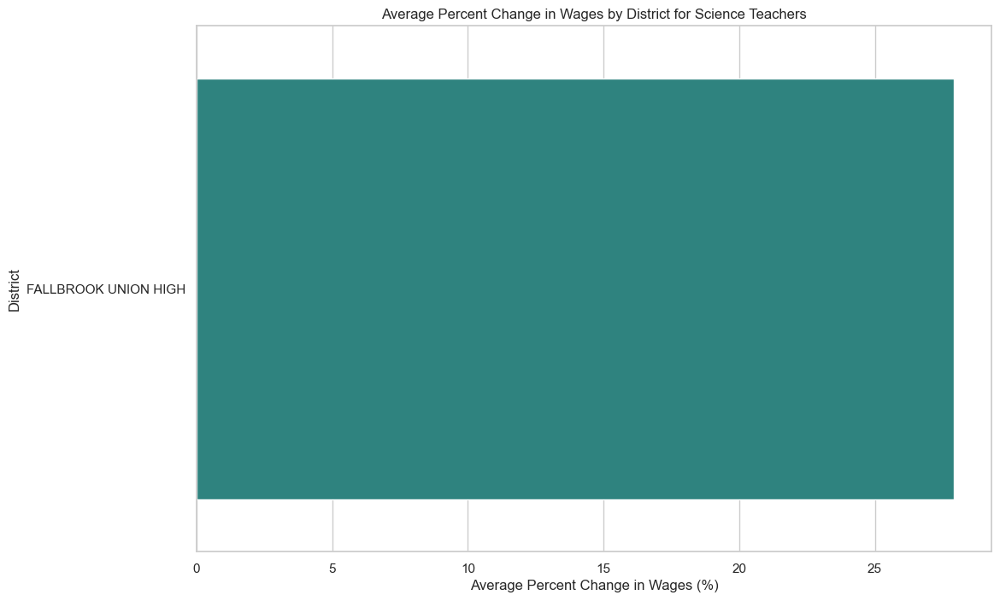

C:\Users\khali\AppData\Local\Temp\ipykernel_10228\1719429861.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subject_data.sort_values(by='percent_change_wages', ascending=False, inplace=True)


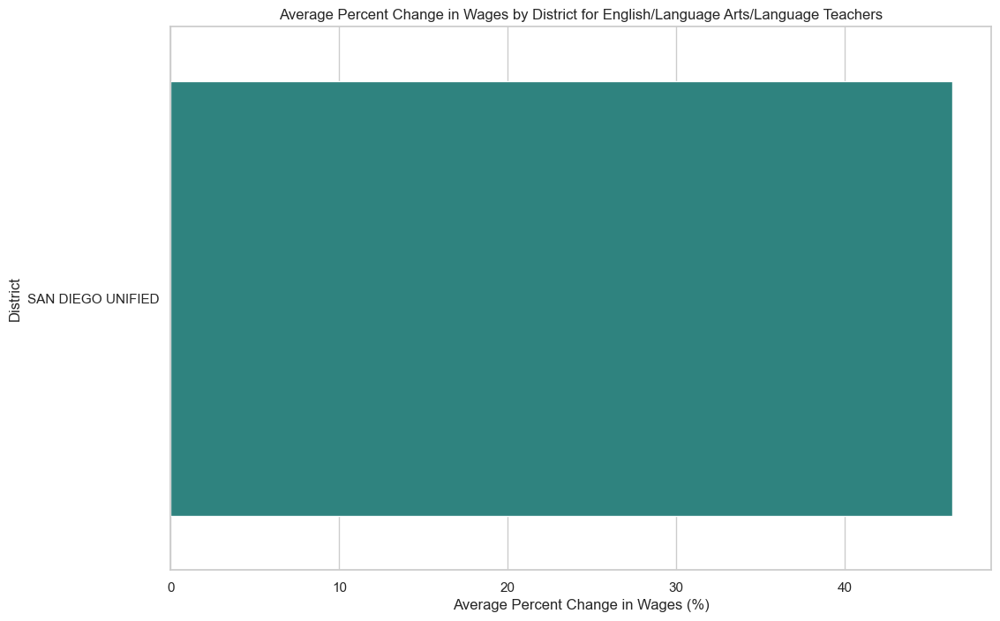

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

#Calculate the percent change in wages for each switch
single_switch_df['percent_change_wages'] = ((single_switch_df['new_pay_and_benefits'] - single_switch_df['previous_pay_and_benefits']) / single_switch_df['previous_pay_and_benefits']) * 100

#Group by new district and subject, and calculate the average percent change in wages
average_percent_change_by_subject = single_switch_df.groupby(['new_dist', 'subject'])['percent_change_wages'].mean().reset_index()

#Loop over each subject to create separate graphs
for subject in average_percent_change_by_subject['subject'].unique():
    # Filter the data for the current subject
    subject_data = average_percent_change_by_subject[average_percent_change_by_subject['subject'] == subject]

    # Sort the districts by average percent change for the current subject
    subject_data.sort_values(by='percent_change_wages', ascending=False, inplace=True)

    
    sns.set(style="whitegrid")

    
    plt.figure(figsize=(12, 8))
    sns.barplot(x='percent_change_wages', y='new_dist', data=subject_data, palette='viridis')


    plt.xlabel('Average Percent Change in Wages (%)')
    plt.ylabel('District')
    plt.title(f'Average Percent Change in Wages by District for {subject} Teachers')


    plt.show()


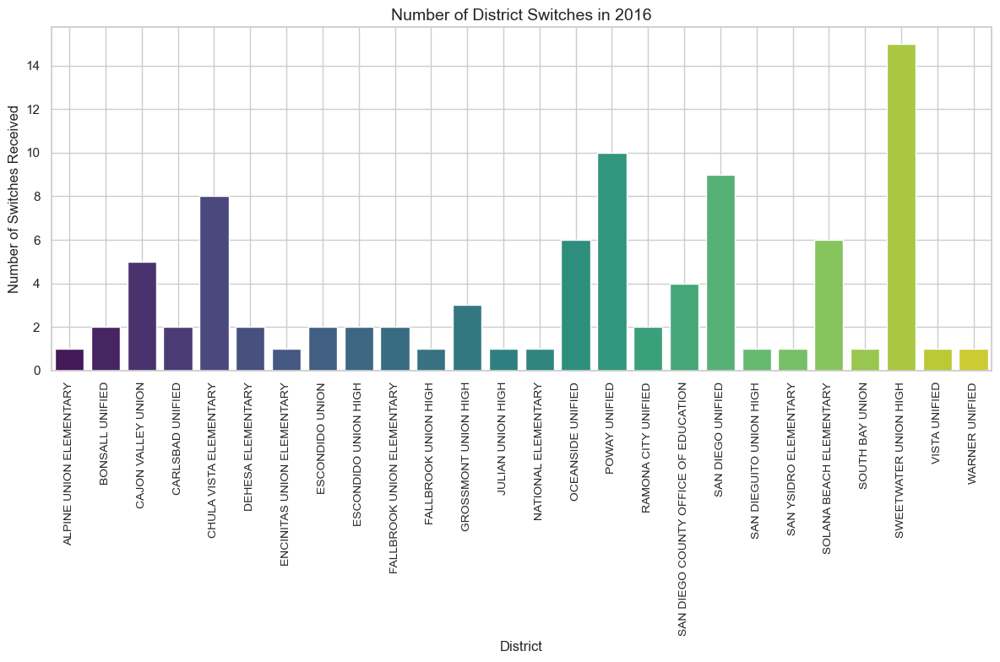

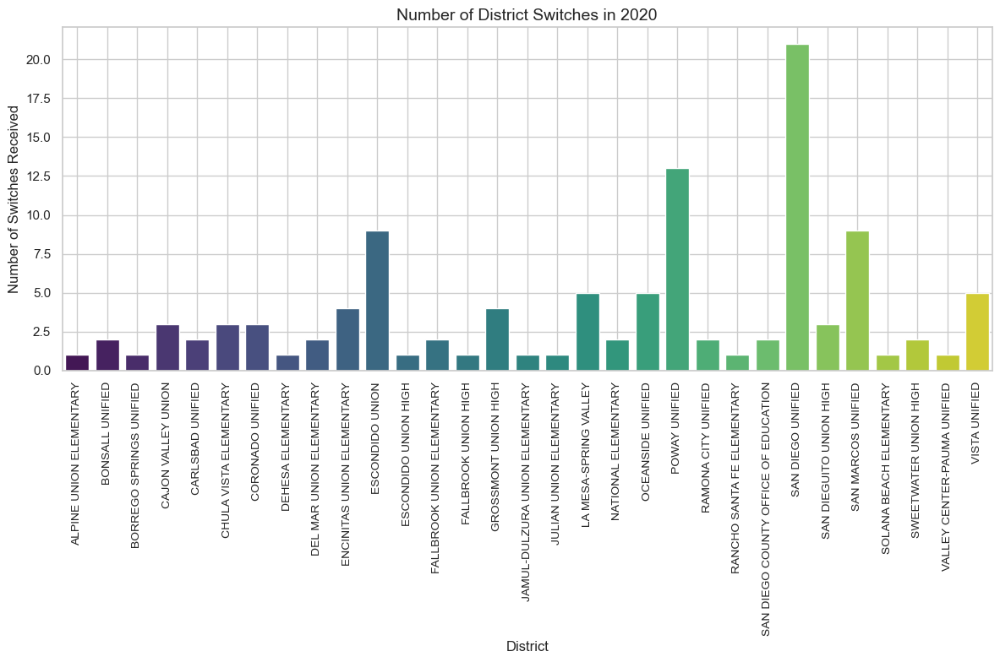

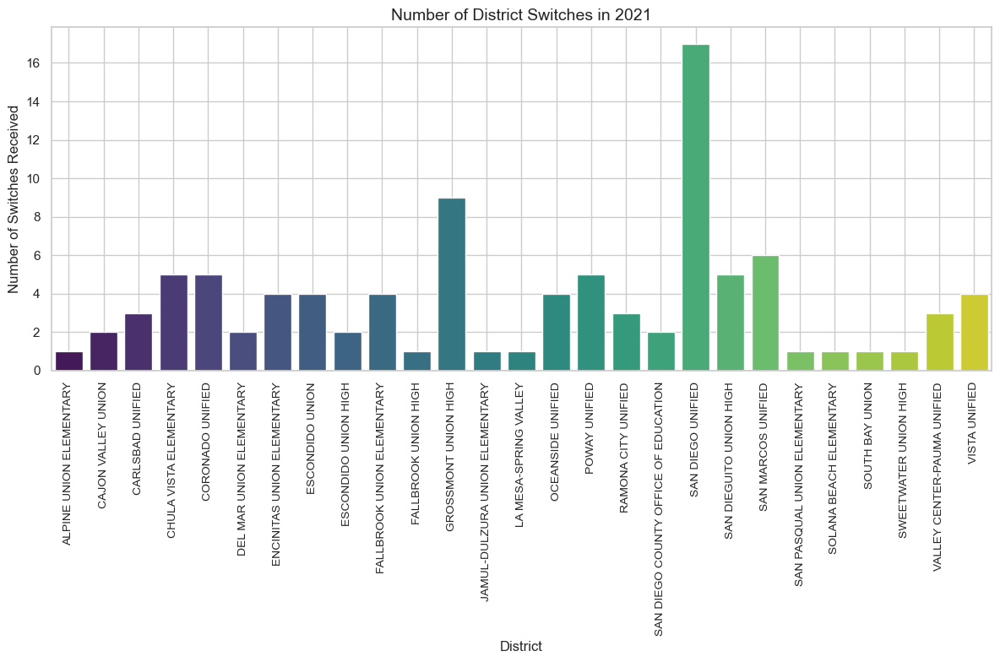

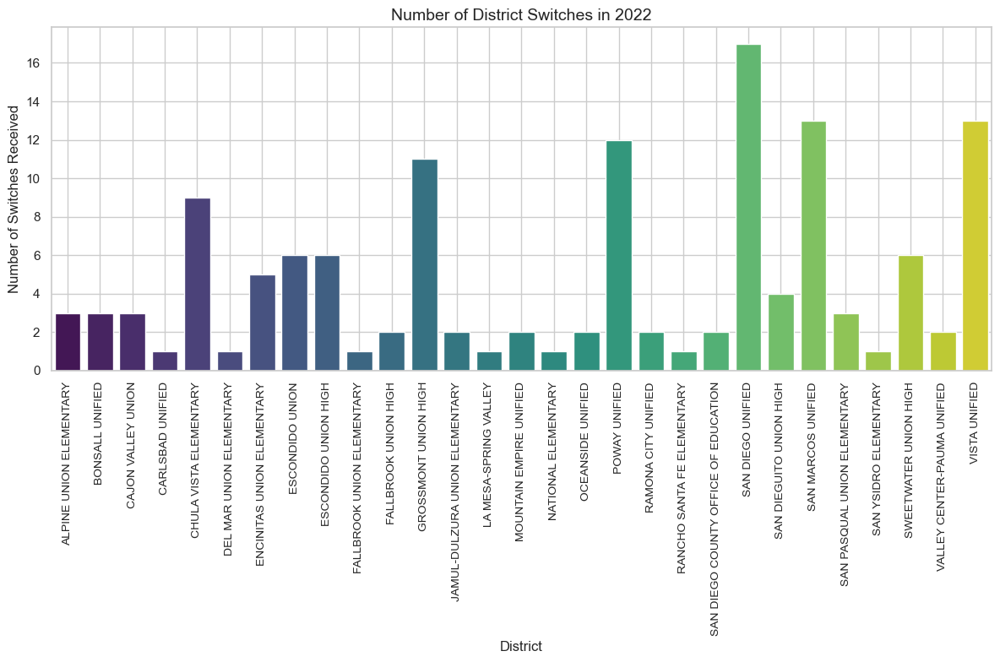

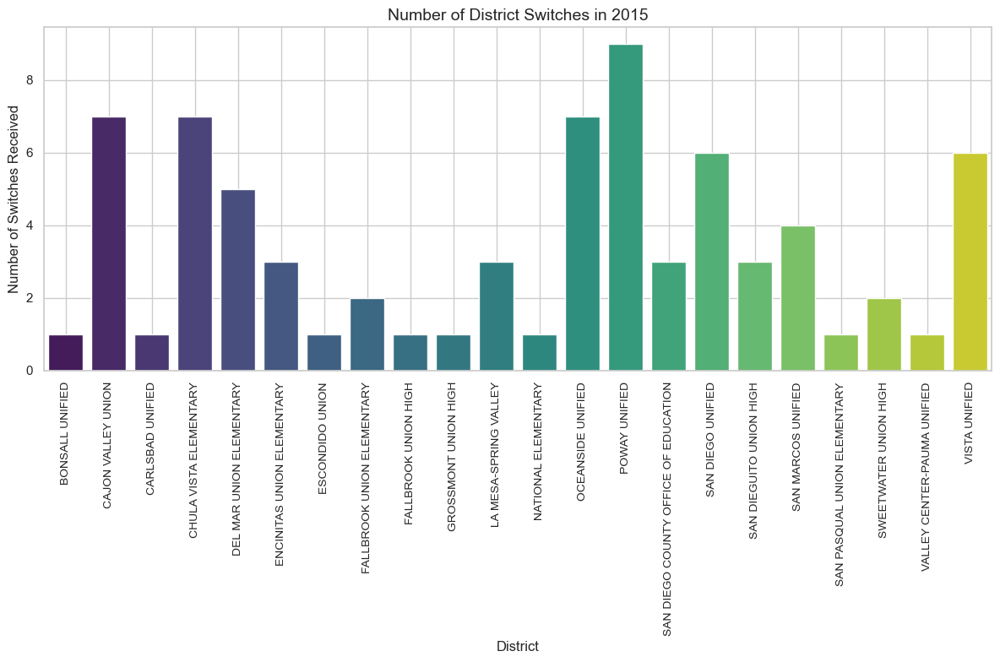

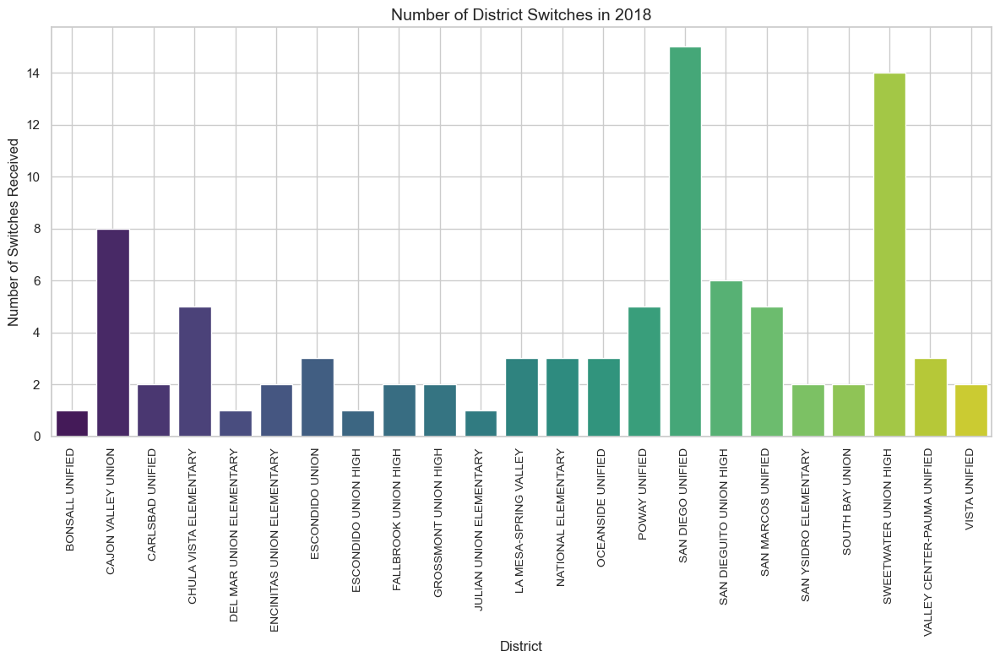

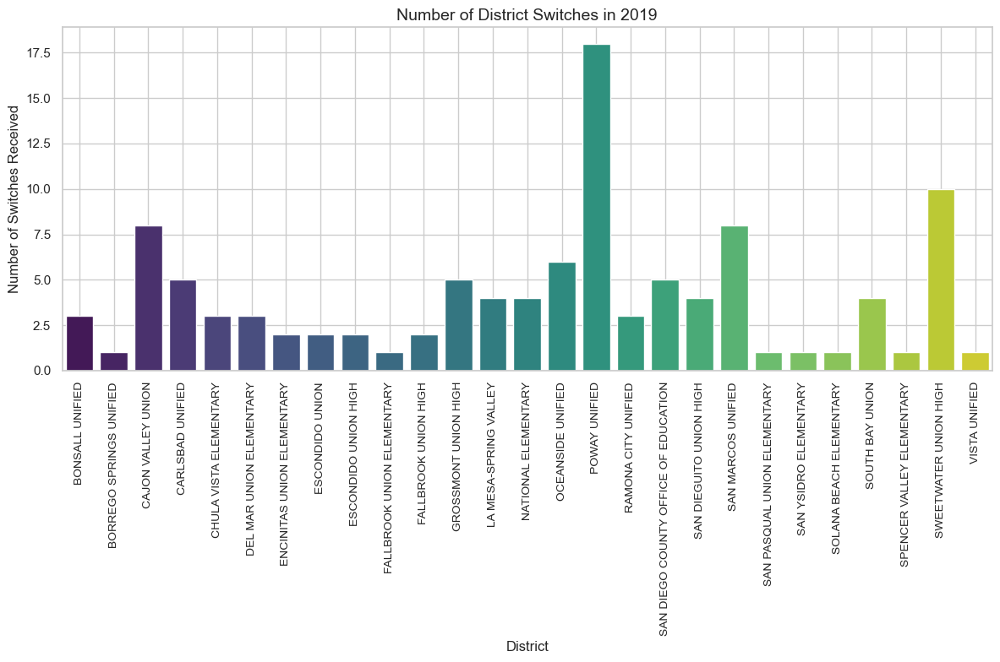

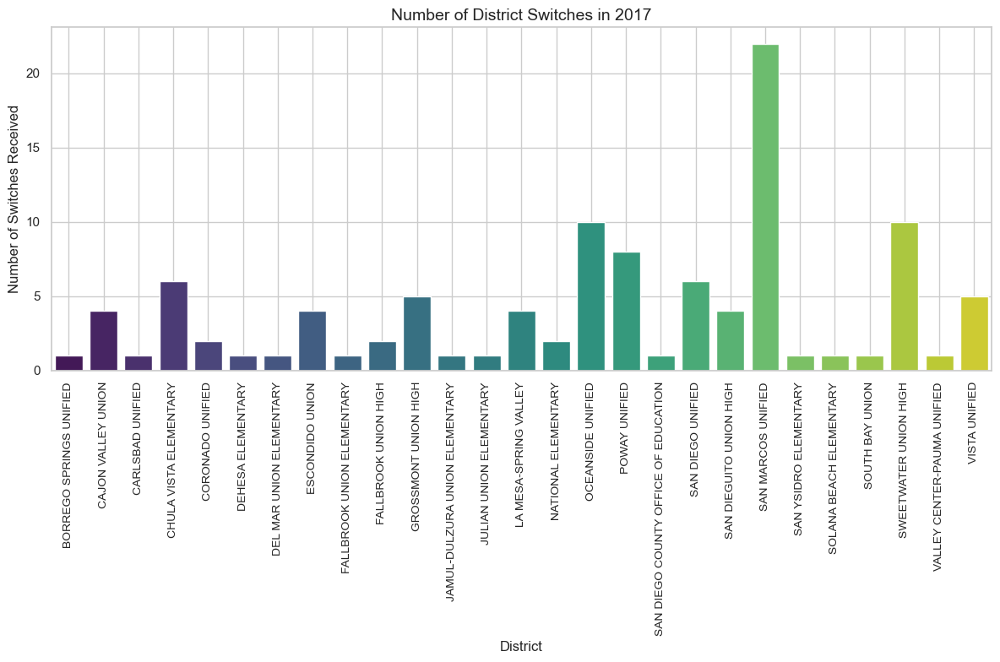

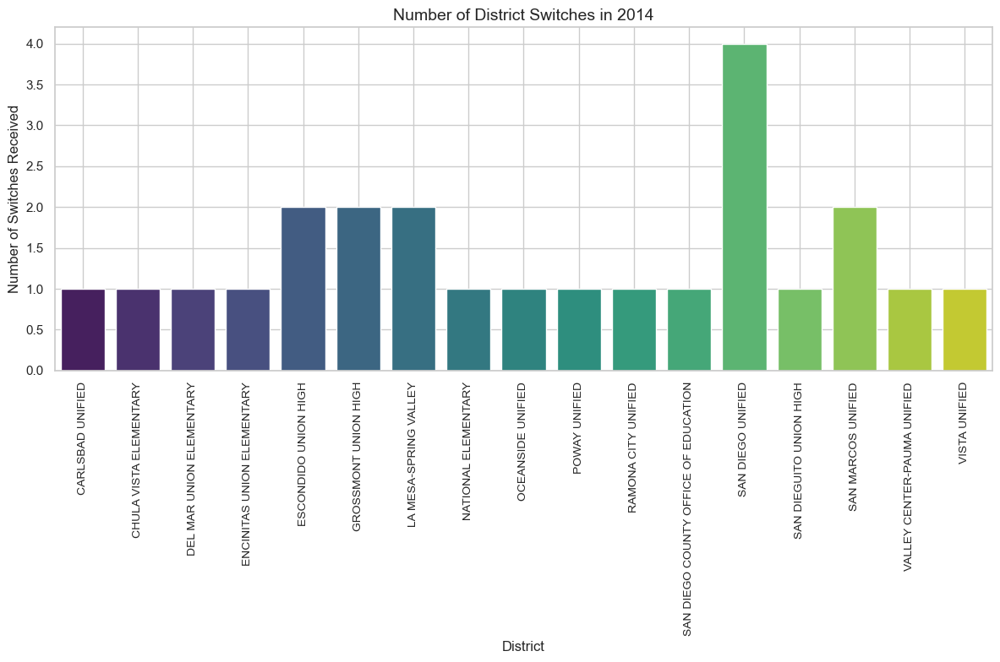

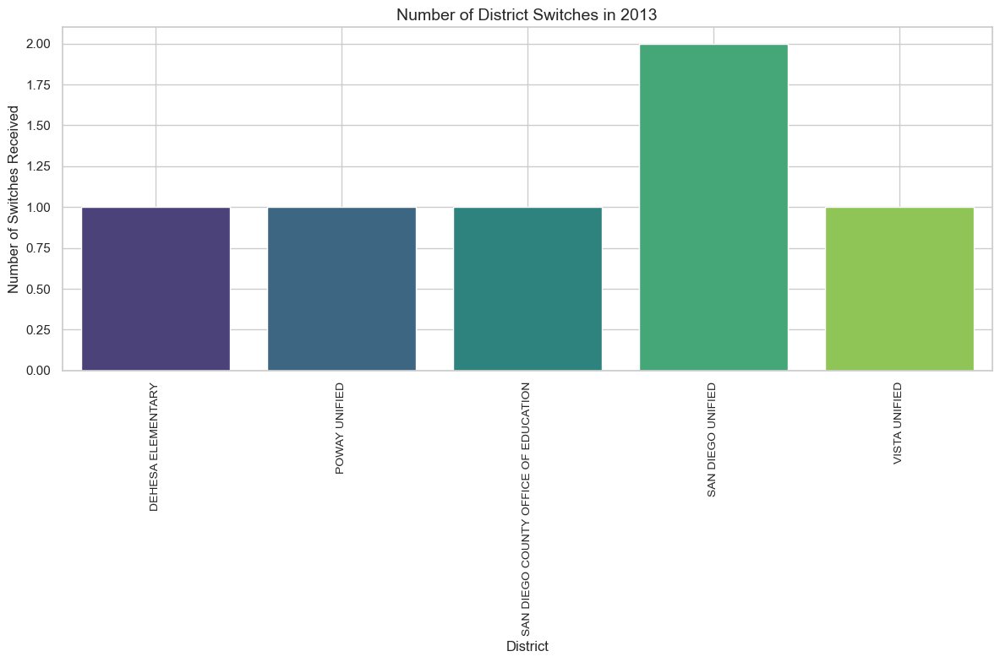

In [15]:
#Count the number of switches per district per year
switch_counts = single_switch_df.groupby(['new_dist', 'year']).size().reset_index(name='switch_count')

#Get unique years from the dataset
unique_years = switch_counts['year'].unique()

#Create a bar graph for each year
for year in unique_years:
    
    year_data = switch_counts[switch_counts['year'] == year]
    
    plt.figure(figsize=(12, 8))
    sns.barplot(data=year_data, x='new_dist', y='switch_count', palette='viridis')
    
    plt.xlabel('District', fontsize=12)
    plt.ylabel('Number of Switches Received', fontsize=12)
    plt.title(f'Number of District Switches in {year}', fontsize=14)
    
    # Rotate x-ticks to be vertical and make them smaller
    plt.xticks(rotation=90, fontsize=10)
    
    plt.grid(True)
    plt.tight_layout() 
    plt.show()


####

#

# Calculate the Average Percent Change in Wages for Teachers Who Stayed in Each District

In [297]:
# Sort the data by teacher name and year
teacher_data.sort_values(by=['name', 'year', 'dist'], inplace=True)

# Identify teachers who stayed in the same district across years (no district switch)
teacher_data['district_stayed'] = teacher_data['dist'] == teacher_data['dist'].shift(1)
teacher_data['same_teacher'] = teacher_data['name'] == teacher_data['name'].shift(1)

teacher_data['stayed'] = teacher_data['district_stayed'] & teacher_data['same_teacher']

# Filter for rows where teachers stayed in the same district across consecutive years
stayers_df = teacher_data[teacher_data['stayed']].copy()


In [298]:
# Calculate the percent change in wages for teachers who stayed in the same district
stayers_df['percent_change_wages'] = stayers_df.groupby(['name', 'dist'])['pay_and_benefits_adjusted'].pct_change() * 100

stayers_df.dropna(subset=['percent_change_wages'], inplace=True)

# Group by district and year to calculate the average percent change in wages for stayers
average_percent_change_stayers = stayers_df.groupby(['dist', 'year'])['percent_change_wages'].mean().reset_index()

# Rename columns
average_percent_change_stayers.columns = ['District', 'Year', 'Average Percent Change (Stayers)']

average_percent_change_stayers.head()


,District,Year,Average Percent Change (Stayers)
0,ALPINE UNION ELEMENTARY,2015,-3.112336
1,ALPINE UNION ELEMENTARY,2016,-0.249910
2,ALPINE UNION ELEMENTARY,2017,-3.439455
3,ALPINE UNION ELEMENTARY,2018,3.854102
4,ALPINE UNION ELEMENTARY,2019,0.622401


# Use the Average Percent Change to Calculate "Would-Be" Salary for Switchers

In [299]:
# Merge the average percent change for stayers with the single_switch_df (containing switchers)
single_switch_df = pd.merge(single_switch_df, average_percent_change_stayers, how='left', left_on=['previous_dist', 'year'], right_on=['District', 'Year'])

# Calculate the "would-be" salary for switchers based on the percent change of stayers
single_switch_df['would_be_salary'] = single_switch_df['previous_pay_and_benefits'] * (1 + single_switch_df['Average Percent Change (Stayers)'] / 100)

# Create a comparison table showing actual salary vs "would-be" salary
comparison_df = single_switch_df[['name', 'year', 'previous_dist', 'new_dist', 'previous_pay_and_benefits', 'new_pay_and_benefits', 'would_be_salary', 'subject']]

comparison_df.head()


,name,year,previous_dist,new_dist,previous_pay_and_benefits,new_pay_and_benefits,would_be_salary,subject
0,AARON PLUMB,2020,SAN DIEGO UNIFIED,CAJON VALLEY UNION,80293.270488,88858.327521,86183.376379,Other
1,AARON SILVERTHORN,2016,GROSSMONT UNION HIGH,RAMONA CITY UNIFIED,59739.992980,59584.601607,64409.693408,Other
2,ABIGAIL BUELNA,2020,CHULA VISTA ELEMENTARY,ESCONDIDO UNION,98301.162962,51007.976500,103149.174471,Other
3,ABIGAIL BUELNA,2022,ESCONDIDO UNION,SAN YSIDRO ELEMENTARY,51007.976500,58146.697700,49762.922450,Other
4,ABRAHAM SHKLAR,2020,VISTA UNIFIED,SAN DIEGO UNIFIED,80835.681761,77541.456685,80079.811808,Other


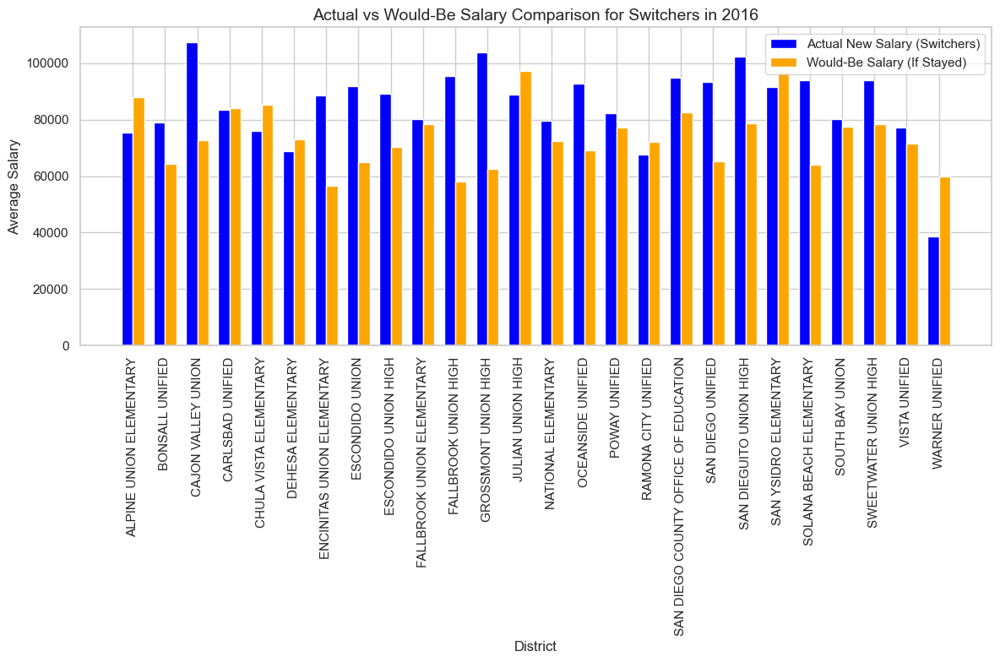

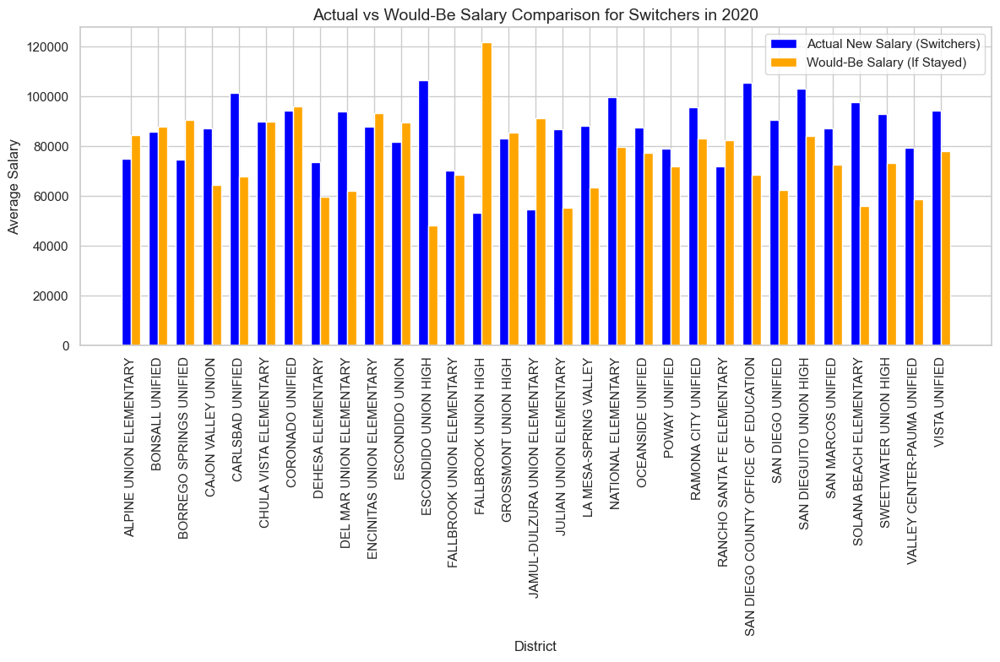

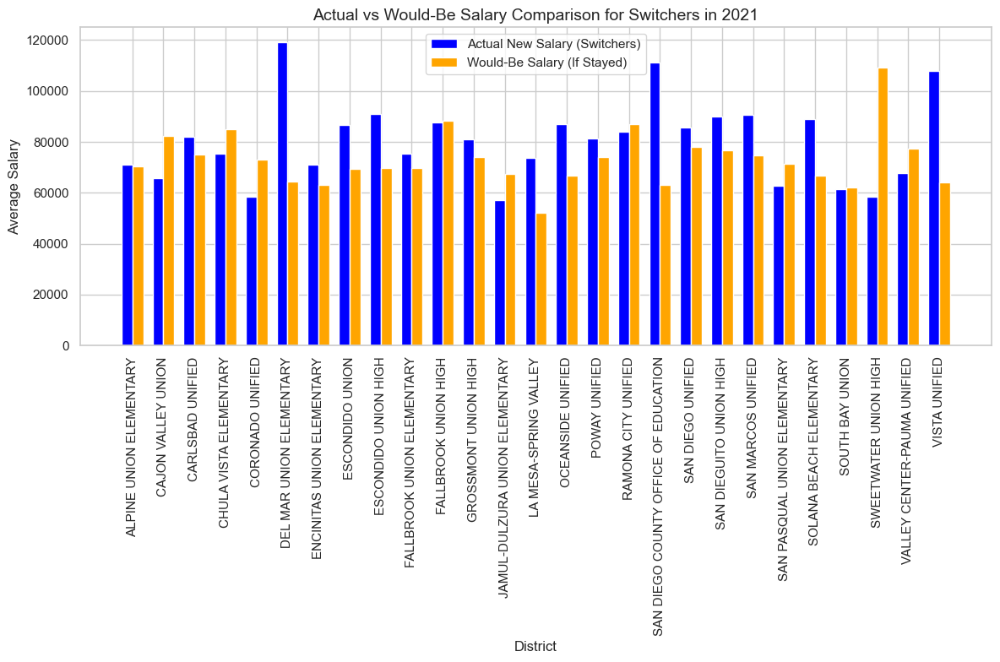

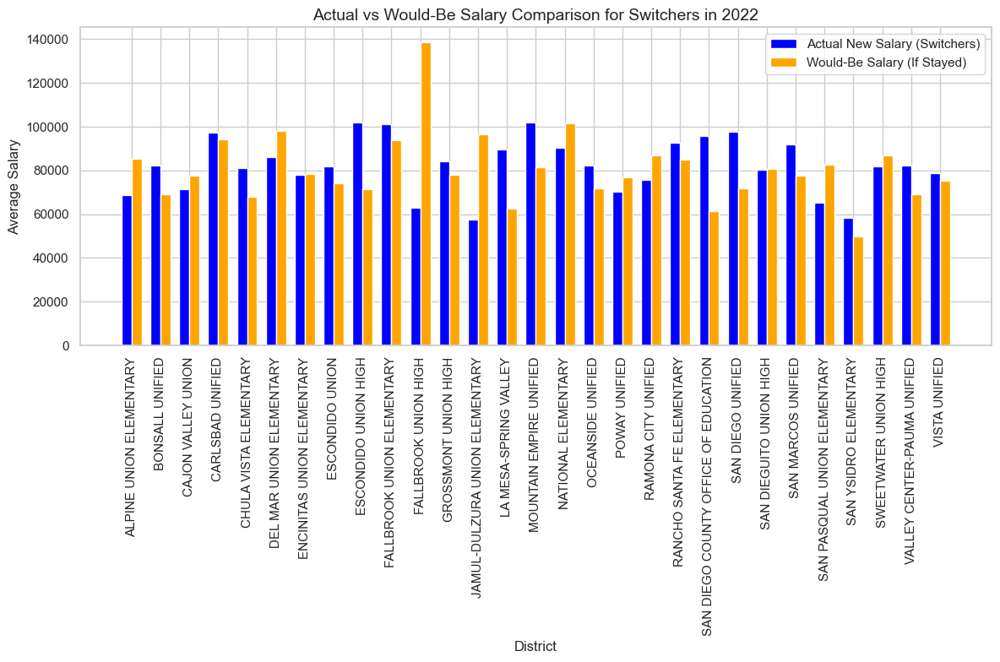

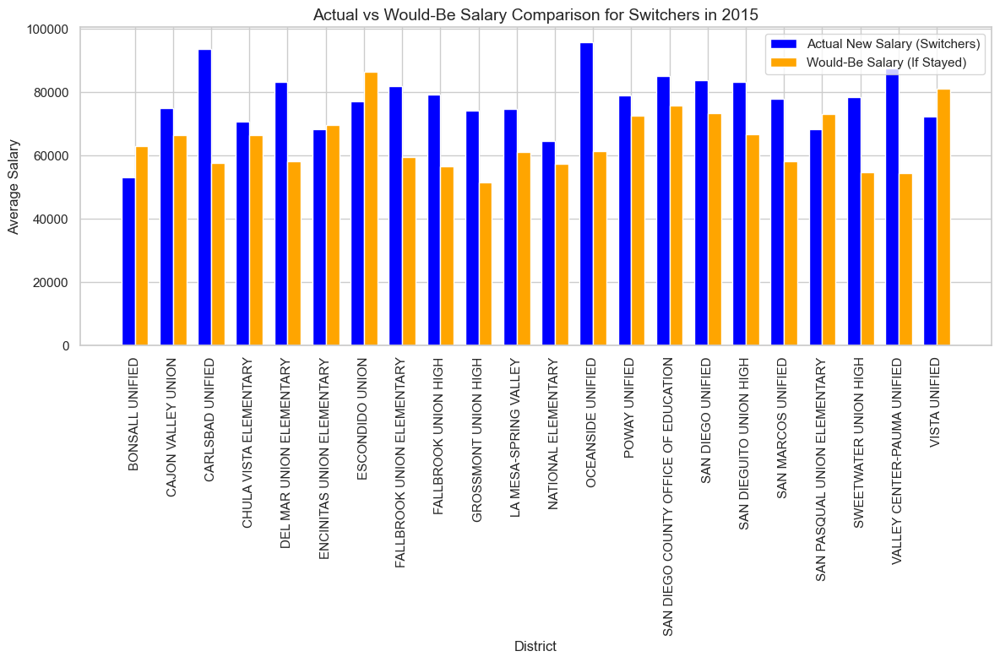

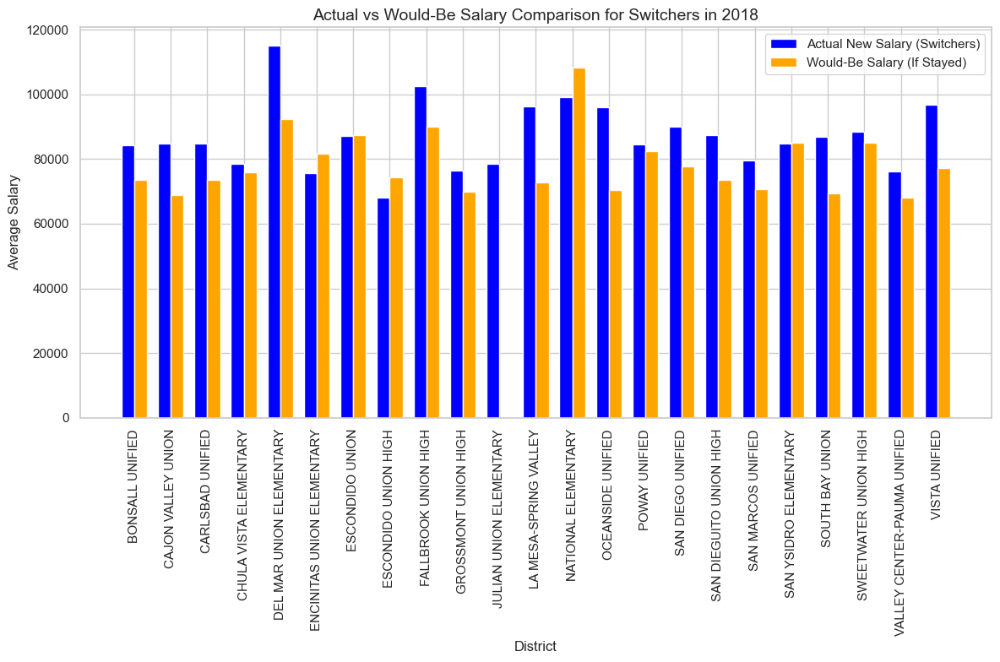

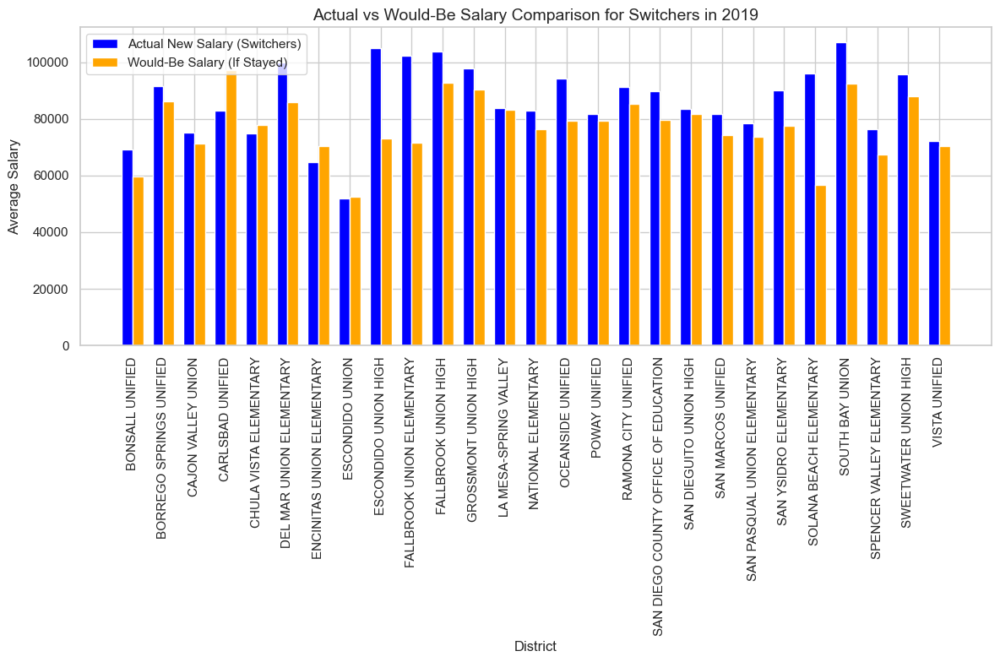

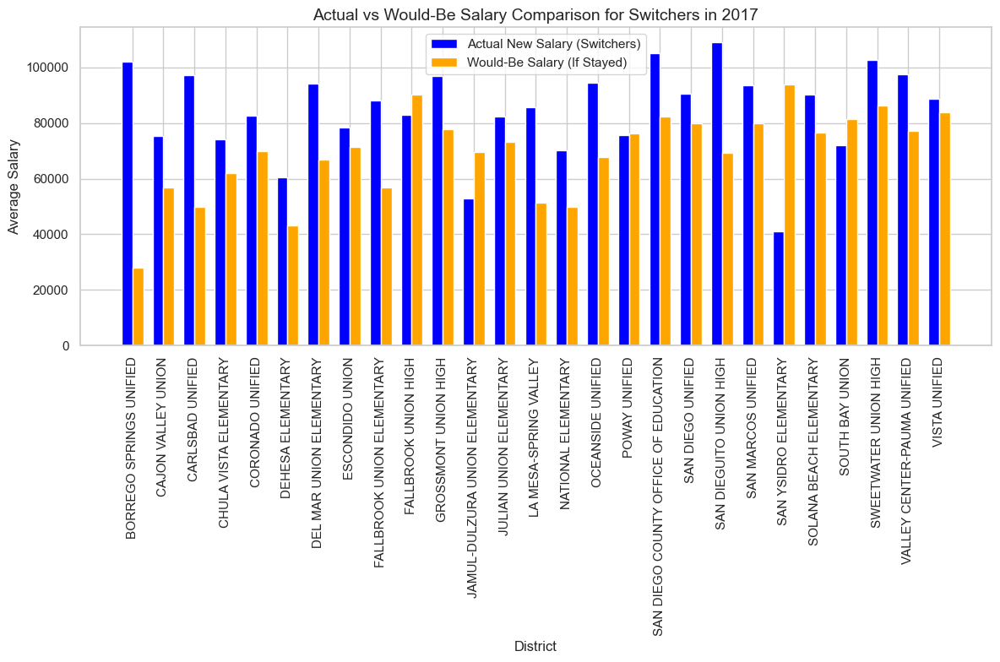

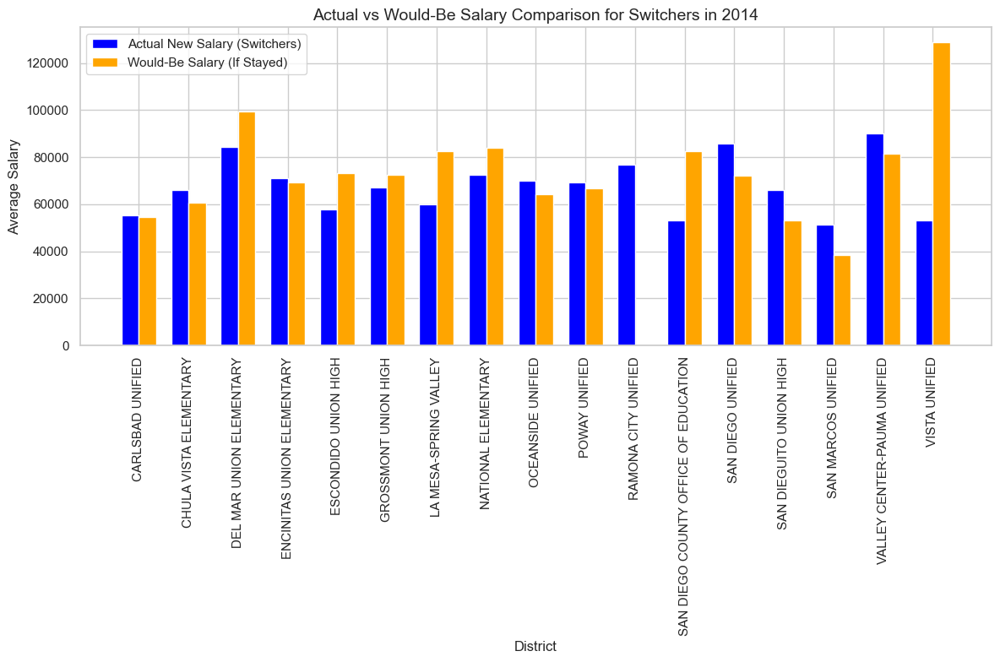

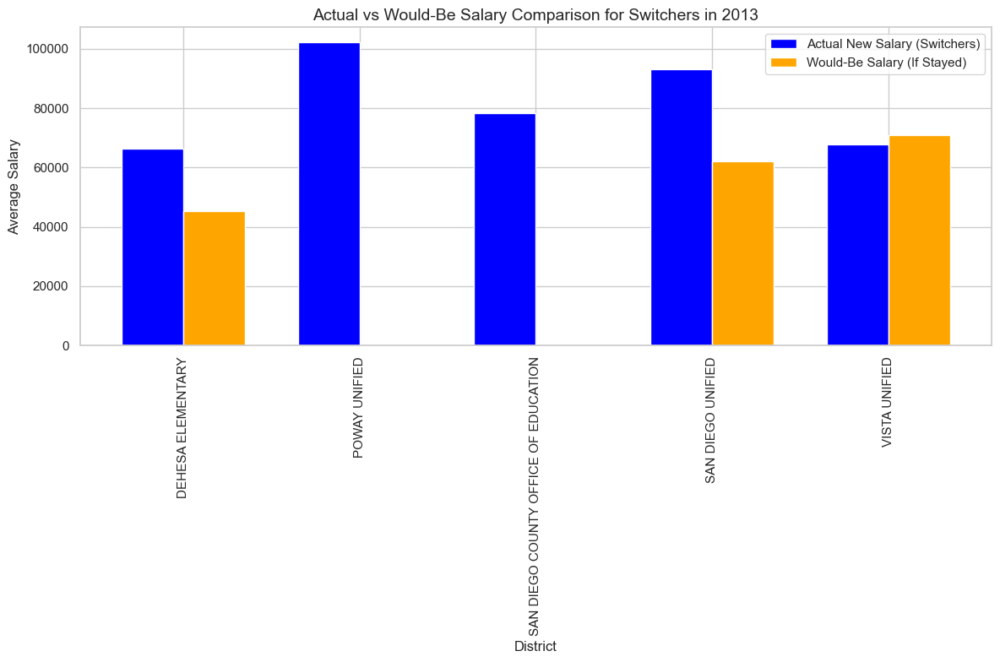

In [302]:
import pandas as pd
import matplotlib.pyplot as plt

#Calculate the average actual wage increase (new salary) for teachers who switched districts, grouped by new district and year
avg_new_salary_switch = comparison_df.groupby(['new_dist', 'year'])['new_pay_and_benefits'].mean().reset_index()
avg_new_salary_switch.rename(columns={'new_pay_and_benefits': 'avg_new_salary'}, inplace=True)

#Calculate the average "would-be" salary based on the stayers' percent change, grouped by new district and year
avg_would_be_salary = comparison_df.groupby(['new_dist', 'year'])['would_be_salary'].mean().reset_index()
avg_would_be_salary.rename(columns={'would_be_salary': 'avg_would_be_salary'}, inplace=True)

#Merge the two DataFrames on new district and year
salary_comparison_df = pd.merge(avg_new_salary_switch, avg_would_be_salary, on=['new_dist', 'year'])

#Generate a separate plot for each year
years = salary_comparison_df['year'].unique()

for year in years:
    year_data = salary_comparison_df[salary_comparison_df['year'] == year]

    fig, ax = plt.subplots(figsize=(12, 8))

    bar_width = 0.35

    r1 = range(len(year_data))
    r2 = [x + bar_width for x in r1]

    ax.bar(r1, year_data['avg_new_salary'], color='blue', width=bar_width, label='Actual New Salary (Switchers)')
    ax.bar(r2, year_data['avg_would_be_salary'], color='orange', width=bar_width, label='Would-Be Salary (If Stayed)')

    ax.set_xlabel('District', fontsize=12)
    ax.set_ylabel('Average Salary', fontsize=12)
    ax.set_title(f'Actual vs Would-Be Salary Comparison for Switchers in {year}', fontsize=14)
    ax.set_xticks([r + bar_width / 2 for r in range(len(year_data))])
    ax.set_xticklabels(year_data['new_dist'], rotation=90)

    ax.legend()
    plt.tight_layout()
    plt.show()


In [304]:
# Group by year and create tables for each year
years = comparison_df['year'].unique()

# Loop through each year and display a table for each year
yearly_tables = {}

for year in years:
    year_df = comparison_df[comparison_df['year'] == year]
    
    yearly_tables[year] = year_df
    
    print(f"Table for the year {year}:")
    display(year_df)
    print("\n")


Table for the year 2020:


,name,year,previous_dist,new_dist,previous_pay_and_benefits,new_pay_and_benefits,would_be_salary,subject
0,AARON PLUMB,2020,SAN DIEGO UNIFIED,CAJON VALLEY UNION,80293.270488,88858.327521,86183.376379,Other
2,ABIGAIL BUELNA,2020,CHULA VISTA ELEMENTARY,ESCONDIDO UNION,98301.162962,51007.976500,103149.174471,Other
4,ABRAHAM SHKLAR,2020,VISTA UNIFIED,SAN DIEGO UNIFIED,80835.681761,77541.456685,80079.811808,Other
7,ADAN CERVANTES,2020,LA MESA-SPRING VALLEY,OCEANSIDE UNIFIED,38291.013834,76047.562314,39895.684027,Other
8,ADRIENNE REED,2020,ESCONDIDO UNION,SAN DIEGO COUNTY OFFICE OF EDUCATION,83744.157088,113465.003327,81664.211696,PE
...,...,...,...,...,...,...,...,...
813,TRACI SCHWING,2020,SAN DIEGO UNIFIED,OCEANSIDE UNIFIED,61740.853884,71434.586822,66270.002653,Other
815,TRIEVA RUE,2020,VALLEY CENTER-PAUMA UNIFIED,POWAY UNIFIED,53451.216805,87916.215988,54713.172490,Other
830,VICTORIA HESSENFLOW,2020,SAN DIEGO UNIFIED,ESCONDIDO UNION,109924.603598,93298.316432,117988.387166,PE
833,WEIXIA VELIS,2020,SWEETWATER UNION HIGH,SAN DIEGO UNIFIED,66309.709344,70001.015977,65945.336724,Other




Table for the year 2016:


,name,year,previous_dist,new_dist,previous_pay_and_benefits,new_pay_and_benefits,would_be_salary,subject
1,AARON SILVERTHORN,2016,GROSSMONT UNION HIGH,RAMONA CITY UNIFIED,59739.992980,59584.601607,64409.693408,Other
26,ALLISON MAGEE,2016,SAN DIEGO UNIFIED,CARLSBAD UNIFIED,80038.243579,91093.545813,84036.928313,Other
29,ALLISON WAGNER,2016,CHULA VISTA ELEMENTARY,SWEETWATER UNION HIGH,61045.832131,86844.554451,63213.091282,Other
50,AMY AMERLING,2016,GROSSMONT UNION HIGH,CAJON VALLEY UNION,76713.797408,89004.301350,82710.290456,PE
59,AMY JENSEN,2016,SAN MARCOS UNIFIED,SAN DIEGO COUNTY OFFICE OF EDUCATION,101164.953233,64310.273609,NaN,PE
...,...,...,...,...,...,...,...,...
826,VICTOR VARGAS,2016,SAN YSIDRO ELEMENTARY,SWEETWATER UNION HIGH,80720.170811,111388.460794,91458.163138,Other
828,VICTORIA CORTES,2016,CHULA VISTA ELEMENTARY,SAN DIEGO UNIFIED,61486.872646,97976.381856,63669.789690,Other
834,WENDY CASTILLO,2016,CHULA VISTA ELEMENTARY,CAJON VALLEY UNION,68839.368784,108765.071902,71283.315353,Other
841,YENNI ELSAS,2016,NATIONAL ELEMENTARY,CHULA VISTA ELEMENTARY,71681.643059,78651.262778,80603.814926,Other




Table for the year 2022:


,name,year,previous_dist,new_dist,previous_pay_and_benefits,new_pay_and_benefits,would_be_salary,subject
3,ABIGAIL BUELNA,2022,ESCONDIDO UNION,SAN YSIDRO ELEMENTARY,51007.976500,58146.697700,49762.922450,Other
6,ADAM MILHOLLAND,2022,VISTA UNIFIED,SAN DIEGUITO UNION HIGH,90908.440283,68534.972052,90421.767788,Other
11,ALEX GUERRERO,2022,LA MESA-SPRING VALLEY,GROSSMONT UNION HIGH,68547.041586,76928.562478,67309.888064,PE
14,ALEXANDER PATTERSON,2022,SAN DIEGO UNIFIED,SAN DIEGUITO UNION HIGH,65646.189691,73809.306890,63352.021708,Other
18,ALISHA THOMSON,2022,SAN DIEGO UNIFIED,POWAY UNIFIED,73073.498327,59844.409039,70519.764729,Other
...,...,...,...,...,...,...,...,...
817,TY GUZIK,2022,SAN DIEGUITO UNION HIGH,SAN MARCOS UNIFIED,87205.743551,115094.725728,85198.352993,PE
823,VERONICA MARTINEZ,2022,ESCONDIDO UNION HIGH,SAN DIEGO UNIFIED,58632.056190,122845.008915,60760.869475,Other
831,VIRGINIA ALLEN,2022,POWAY UNIFIED,ESCONDIDO UNION HIGH,72820.688137,112294.252413,66988.457689,Other
835,WENDY FISHER,2022,BONSALL UNIFIED,SAN MARCOS UNIFIED,83891.394871,97885.472567,82610.190971,Other




Table for the year 2021:


,name,year,previous_dist,new_dist,previous_pay_and_benefits,new_pay_and_benefits,would_be_salary,subject
5,ADAM BARRY,2021,SWEETWATER UNION HIGH,SAN DIEGO UNIFIED,74227.185112,73333.325113,72917.804429,Other
9,ALANNAH BABAUTA,2021,DEL MAR UNION ELEMENTARY,POWAY UNIFIED,76754.050928,69783.120810,77202.780672,Other
13,ALEXANDER MCFARR,2021,SWEETWATER UNION HIGH,ESCONDIDO UNION HIGH,81362.122856,85439.411637,79926.880608,Other
25,ALLISON HUDES,2021,DEL MAR UNION ELEMENTARY,SAN DIEGO UNIFIED,112824.422597,121400.041082,113484.031748,Other
34,ALSACIA APODACA,2021,SWEETWATER UNION HIGH,GROSSMONT UNION HIGH,79583.391581,67708.072997,78179.526468,Other
...,...,...,...,...,...,...,...,...
797,TIFFANY CICCONE,2021,SAN DIEGO UNIFIED,CORONADO UNIFIED,73073.822293,56648.212193,74144.013889,Other
806,TIMOTHY MURPHY,2021,SWEETWATER UNION HIGH,SAN DIEGO UNIFIED,61196.065326,61629.513171,60116.555902,Other
822,VERONICA DELGADO,2021,CHULA VISTA ELEMENTARY,SAN DIEGO UNIFIED,84106.058351,64962.807617,81393.995538,English/Language Arts/Language
839,WILLIAM PORTER III,2021,DEL MAR UNION ELEMENTARY,VISTA UNIFIED,54998.760414,134437.509724,55320.301485,Other




Table for the year 2015:


,name,year,previous_dist,new_dist,previous_pay_and_benefits,new_pay_and_benefits,would_be_salary,subject
10,ALETHA CROSS,2015,OCEANSIDE UNIFIED,VISTA UNIFIED,64818.445639,67824.836286,71576.900126,Other
17,ALIGHIERI REZA,2015,CHULA VISTA ELEMENTARY,SWEETWATER UNION HIGH,65292.481257,72398.020731,68964.126360,Other
19,ALISON ANTENORCRUZ,2015,SAN DIEGO UNIFIED,CHULA VISTA ELEMENTARY,70348.562722,87709.728159,75702.475355,Other
20,ALISON LABASTIDA,2015,SAN DIEGO UNIFIED,SAN DIEGO COUNTY OFFICE OF EDUCATION,73547.703010,107885.941329,79145.087819,PE
23,ALLISON HODGES,2015,CHULA VISTA ELEMENTARY,DEL MAR UNION ELEMENTARY,50757.055962,82021.552478,53611.318695,Other
...,...,...,...,...,...,...,...,...
750,SHARON DUNCAN,2015,SOLANA BEACH ELEMENTARY,SAN MARCOS UNIFIED,75729.169767,78570.663127,NaN,PE
751,SHARON MOODY,2015,VISTA UNIFIED,DEL MAR UNION ELEMENTARY,46722.285896,109308.779568,50630.893409,Other
765,STACEY MOYER,2015,RAMONA CITY UNIFIED,CAJON VALLEY UNION,61703.222629,89380.200156,64495.330739,PE
766,STACY BERMINGHAM,2015,SAN DIEGO COUNTY OFFICE OF EDUCATION,ESCONDIDO UNION,78786.162180,77001.350548,86384.048613,Other




Table for the year 2019:


,name,year,previous_dist,new_dist,previous_pay_and_benefits,new_pay_and_benefits,would_be_salary,subject
12,ALEXA CARCOVA,2019,CHULA VISTA ELEMENTARY,POWAY UNIFIED,88105.948172,81155.417579,92195.932092,Other
24,ALLISON HUDES,2019,SAN DIEGO UNIFIED,DEL MAR UNION ELEMENTARY,101749.266546,112824.422597,99990.572133,Other
30,ALLISON WARREN,2019,DEL MAR UNION ELEMENTARY,RAMONA CITY UNIFIED,98934.669754,84104.629594,107179.444413,Other
35,ALYSSA ROSCOE,2019,CHULA VISTA ELEMENTARY,POWAY UNIFIED,85997.527423,87862.090942,89989.635920,Other
39,AMANDA GREENWOOD,2019,SAN PASQUAL UNION ELEMENTARY,POWAY UNIFIED,59008.206601,62162.456283,61005.427557,Other
...,...,...,...,...,...,...,...,...
819,VALERIE ZUKOWSKI,2019,DEL MAR UNION ELEMENTARY,FALLBROOK UNION ELEMENTARY,66105.687598,102190.555526,71614.641126,PE
821,VEASNA KEO,2019,SAN MARCOS UNIFIED,OCEANSIDE UNIFIED,87999.168978,86406.344086,93612.278178,Other
829,VICTORIA HEMERICK,2019,DEL MAR UNION ELEMENTARY,CARLSBAD UNIFIED,109441.180434,106124.035618,118561.520891,Other
836,WENDY HERRERA,2019,CHULA VISTA ELEMENTARY,SWEETWATER UNION HIGH,97636.115100,114247.345550,102168.500813,Other




Table for the year 2014:


,name,year,previous_dist,new_dist,previous_pay_and_benefits,new_pay_and_benefits,would_be_salary,subject
15,ALICIA MYER,2014,CHULA VISTA ELEMENTARY,POWAY UNIFIED,62929.630000,69179.963032,66620.259653,Other
45,AMANDA WOLFE,2014,GROSSMONT UNION HIGH,ESCONDIDO UNION HIGH,64803.270000,50979.399503,67249.734447,Other
65,AMY SMITH,2014,SAN DIEGO UNIFIED,DEL MAR UNION ELEMENTARY,88866.322077,84238.049850,99334.310314,Other
66,AMY SYMONS,2014,CHULA VISTA ELEMENTARY,LA MESA-SPRING VALLEY,64710.780000,74422.813246,68505.868634,Other
165,CHRISTIAN TORDAHL,2014,SWEETWATER UNION HIGH,VALLEY CENTER-PAUMA UNIFIED,76582.806048,89902.893092,81628.420337,Other
190,CRISTINA CAMPISANO,2014,RANCHO SANTA FE ELEMENTARY,SAN DIEGUITO UNION HIGH,53103.935049,66087.238670,53245.215945,Other
210,DAVID COOK,2014,OCEANSIDE UNIFIED,SAN DIEGO UNIFIED,93312.338625,95561.364541,91734.423523,Other
255,EMILY SULLIVAN,2014,NATIONAL ELEMENTARY,OCEANSIDE UNIFIED,60225.310000,69932.057564,64273.380121,Other
370,JESSICA BELL,2014,SAN DIEGO UNIFIED,SAN MARCOS UNIFIED,15899.116180,50064.751535,17771.948962,Other
375,JESSICA JABALI,2014,SAN DIEGO UNIFIED,SAN DIEGO COUNTY OFFICE OF EDUCATION,73779.310517,53267.862103,82470.127651,PE




Table for the year 2018:


,name,year,previous_dist,new_dist,previous_pay_and_benefits,new_pay_and_benefits,would_be_salary,subject
21,ALISON OWEN,2018,ESCONDIDO UNION,OCEANSIDE UNIFIED,45476.968302,75624.491268,45378.752220,Other
42,AMANDA MARTINEZ,2018,SWEETWATER UNION HIGH,SOUTH BAY UNION,62717.288011,81302.903041,63132.075123,Other
51,AMY AMERLING,2018,CAJON VALLEY UNION,CHULA VISTA ELEMENTARY,89004.301350,91326.673872,91278.404661,Other
55,AMY COPELAND,2018,VALLEY CENTER-PAUMA UNIFIED,ESCONDIDO UNION,86792.916440,107241.455873,85895.710468,Other
98,ASHLEY BENNETT,2018,SOLANA BEACH ELEMENTARY,CAJON VALLEY UNION,85913.482273,72878.290761,89619.060418,Other
...,...,...,...,...,...,...,...,...
798,TIFFANY DEVLIN,2018,ALPINE UNION ELEMENTARY,CHULA VISTA ELEMENTARY,63343.965514,80442.520997,65785.306860,Other
818,VALERIE OBERG,2018,CAJON VALLEY UNION,LA MESA-SPRING VALLEY,50970.283088,71417.195642,52272.598681,Other
820,VANESSA JOY,2018,NATIONAL ELEMENTARY,SAN DIEGO UNIFIED,60282.031734,88648.609039,62462.812334,Other
824,VICTOR MIGNEA,2018,POWAY UNIFIED,GROSSMONT UNION HIGH,62452.529676,73024.583138,63695.692952,Other




Table for the year 2017:


,name,year,previous_dist,new_dist,previous_pay_and_benefits,new_pay_and_benefits,would_be_salary,subject
22,ALISSA PIRO,2017,VISTA UNIFIED,SAN MARCOS UNIFIED,79875.235033,100321.862614,78248.484829,Other
27,ALLISON RASSP,2017,VISTA UNIFIED,SAN MARCOS UNIFIED,54957.482925,68893.186554,53838.211144,Other
28,ALLISON SCHMITT,2017,CHULA VISTA ELEMENTARY,SOLANA BEACH ELEMENTARY,68918.012813,90264.948539,76442.730669,Other
37,AMANDA BELL,2017,OCEANSIDE UNIFIED,SAN DIEGUITO UNION HIGH,42159.169545,110183.014834,44626.753666,Other
57,AMY DANIEL,2017,POWAY UNIFIED,GROSSMONT UNION HIGH,71138.754062,92792.056128,73331.779428,Other
...,...,...,...,...,...,...,...,...
807,TIMOTHY WHITE,2017,JULIAN UNION HIGH,BORREGO SPRINGS UNIFIED,48043.726157,102006.482363,28014.213028,Math
811,TONI FERLAND,2017,CAJON VALLEY UNION,GROSSMONT UNION HIGH,69647.221806,114981.521940,61535.478705,Other
825,VICTOR MORAN,2017,CHULA VISTA ELEMENTARY,SWEETWATER UNION HIGH,56775.383343,73668.829800,62974.325004,Other
827,VICTOR VEGA JR,2017,VISTA UNIFIED,OCEANSIDE UNIFIED,56790.332799,109425.407086,55633.732941,Other




Table for the year 2013:


,name,year,previous_dist,new_dist,previous_pay_and_benefits,new_pay_and_benefits,would_be_salary,subject
31,ALLISON ZLATNICK,2013,OCEANSIDE UNIFIED,VISTA UNIFIED,63662.14,67896.607963,71043.554898,PE
214,DAVID REESE,2013,CARDIFF ELEMENTARY,SAN DIEGO COUNTY OFFICE OF EDUCATION,71602.97,78452.391123,NaN,PE
356,JENNIFER GRIGGS,2013,LA MESA-SPRING VALLEY,DEHESA ELEMENTARY,43402.44,66488.789124,45192.011585,Other
524,LISA GARDNER,2013,JAMUL-DULZURA UNION ELEMENTARY,SAN DIEGO UNIFIED,62193.32,96532.037775,NaN,Other
783,SUSAN NELSON,2013,RAMONA CITY UNIFIED,POWAY UNIFIED,56236.99,102169.817854,NaN,Other
809,TIMOTHY WRIGHT,2013,VISTA UNIFIED,SAN DIEGO UNIFIED,65569.14,89634.076323,62221.446758,Other


#

# Statistical Analysis

## Are the wages of switchers significantly different than would be Salaries

In [305]:
import pandas as pd
import numpy as np
import statsmodels.formula.api as smf



print(comparison_df['would_be_salary'].apply(type).value_counts())

comparison_df['would_be_salary'] = pd.to_numeric(comparison_df['would_be_salary'], errors='coerce')

comparison_df = comparison_df.dropna(subset=['would_be_salary'])

# Apply log transformation
comparison_df['log_salary'] = np.log(comparison_df['would_be_salary'])

model_formula = 'log_salary ~ previous_pay_and_benefits + new_pay_and_benefits + year'

model = smf.ols(model_formula, data=comparison_df).fit()

print(model.summary())


would_be_salary
<class 'float'>    845
Name: count, dtype: int64
                            OLS Regression Results                            
Dep. Variable:             log_salary   R-squared:                       0.916
Model:                            OLS   Adj. R-squared:                  0.916
Method:                 Least Squares   F-statistic:                     3017.
Date:                Tue, 15 Oct 2024   Prob (F-statistic):               0.00
Time:                        12:43:39   Log-Likelihood:                 1014.3
No. Observations:                 833   AIC:                            -2021.
Df Residuals:                     829   BIC:                            -2002.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------

C:\Users\khali\AppData\Local\Temp\ipykernel_12416\3609281694.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  comparison_df['would_be_salary'] = pd.to_numeric(comparison_df['would_be_salary'], errors='coerce')


In [307]:
import statsmodels.formula.api as smf
import numpy as np

# Define the response and covariates
response = 'new_pay_and_benefits'
covariates = ['previous_dist', 'new_dist', 'previous_pay_and_benefits', 'would_be_salary', 'subject']

# Create the model formula
model_formula = f'np.log({response}) ~ ' + ' + '.join(covariates)

# Fit the model using the formula and your DataFrame 'comparison_df'
model = smf.ols(model_formula, data=comparison_df).fit()

# Print the model summary
print(model.summary())


                                 OLS Regression Results                                 
Dep. Variable:     np.log(new_pay_and_benefits)   R-squared:                       0.196
Model:                                      OLS   Adj. R-squared:                  0.109
Method:                           Least Squares   F-statistic:                     2.235
Date:                          Tue, 15 Oct 2024   Prob (F-statistic):           2.11e-08
Time:                                  12:43:39   Log-Likelihood:                 167.68
No. Observations:                           833   AIC:                            -169.4
Df Residuals:                               750   BIC:                             222.8
Df Model:                                    82                                         
Covariance Type:                      nonrobust                                         
                                                            coef    std err          t      P>|t|      [0.025 

# Tax Expenditures for Visualizations

## If every teacher was paid the minimum per district each how much would be saved

In [29]:
teacher_data

,Unnamed: 0,name,position,pay_and_benefits,year,dist,enrollment,pay_and_benefits_adjusted,cleaned_names,category,subject
8,9,SUSAN AABERG,TEACHER-DEAF ED,94992.00,2013,SAN DIEGO UNIFIED,130270,93620.682134,SUSAN AABERG,Teacher,English/Language Arts/Language
9,10,AAMNA KAMIL,TEACHER,67045.93,2012,GROSSMONT UNION HIGH,23675,67045.930000,AAMNA KAMIL,Teacher,Other
10,11,AAMNA KAMIL,TEACHER,70615.32,2013,GROSSMONT UNION HIGH,22965,69595.907314,AAMNA KAMIL,Teacher,Other
11,12,AAMNA KAMIL,TEACHER,77772.07,2014,GROSSMONT UNION HIGH,22555,75425.793456,AAMNA KAMIL,Teacher,Other
12,13,AAMNA KAMIL,TEACHER,78886.21,2015,GROSSMONT UNION HIGH,22220,76415.617862,AAMNA KAMIL,Teacher,Other
...,...,...,...,...,...,...,...,...,...,...,...
214296,214297,ZULMA RIVERA,REGULAR TEACHER,129393.00,2020,SAN DIEGO UNIFIED,129460,114785.911117,ZULMA RIVERA,Teacher,Other
214297,214298,ZULMA RIVERA,TEACHER-BILINGUAL EDUCATION,142689.00,2021,SAN DIEGO UNIFIED,118523,120900.978950,ZULMA RIVERA,Teacher,English/Language Arts/Language
214298,214299,ZULMA RIVERA,TEACHER-BILINGUAL EDUCATION,142418.00,2022,SAN DIEGO UNIFIED,114450,111729.915060,ZULMA RIVERA,Teacher,English/Language Arts/Language
214299,214300,CHRISTINE ZUNIGA,REGULAR TEACHER,89061.00,2013,SAN DIEGO UNIFIED,130270,87775.302884,CHRISTINE ZUNIGA,Teacher,Other


In [30]:
# Group by district, year, and category to calculate the average wage
average_wage_df = teacher_data.groupby(['dist', 'year', 'category'])['pay_and_benefits_adjusted'].mean().reset_index()

In [31]:
min_wage_df = teacher_data.groupby(['dist', 'year', 'category'])['pay_and_benefits_adjusted'].min().reset_index()

In [32]:
max_wage_df = teacher_data.groupby(['dist', 'year', 'category'])['pay_and_benefits_adjusted'].max().reset_index()

# If teacher were paid min median max generally in district

In [33]:
import pandas as pd

# Assuming teacher_data is your dataframe with relevant columns
# Example: teacher_data = pd.read_csv("your_data.csv")

# 1. Calculate total taxes spent per year per district
total_taxes = teacher_data.groupby(['year', 'dist'])['pay_and_benefits'].sum().reset_index()
total_taxes.columns = ['year', 'dist', 'total_taxes_spent']

# 2. Calculate min, median, and max salary for each district
salary_stats = teacher_data.groupby(['year', 'dist'])['pay_and_benefits'].agg(['min', 'median', 'max']).reset_index()
salary_stats.columns = ['year', 'dist', 'min_salary', 'median_salary', 'max_salary']

# 3. Calculate the number of teachers per district per year
num_teachers = teacher_data.groupby(['year', 'dist'])['pay_and_benefits'].count().reset_index()
num_teachers.columns = ['year', 'dist', 'num_teachers']

# 4. Merge the total taxes and salary stats dataframes
merged_data = pd.merge(total_taxes, salary_stats, on=['year', 'dist'])
merged_data = pd.merge(merged_data, num_teachers, on=['year', 'dist'])

# 5. Calculate total taxes if all teachers were paid the min, median, and max salary
merged_data['taxes_min_salary'] = merged_data['min_salary'] * merged_data['num_teachers']
merged_data['taxes_median_salary'] = merged_data['median_salary'] * merged_data['num_teachers']
merged_data['taxes_max_salary'] = merged_data['max_salary'] * merged_data['num_teachers']

# 6. Calculate savings or losses compared to actual taxes spent
merged_data['savings_min_salary'] = merged_data['total_taxes_spent'] - merged_data['taxes_min_salary']
merged_data['savings_median_salary'] = merged_data['total_taxes_spent'] - merged_data['taxes_median_salary']
merged_data['savings_max_salary'] = merged_data['total_taxes_spent'] - merged_data['taxes_max_salary']

# Display the final dataframe with all relevant information
merged_data[['year', 'dist', 'total_taxes_spent', 'taxes_min_salary', 'taxes_median_salary', 'taxes_max_salary', 
             'savings_min_salary', 'savings_median_salary', 'savings_max_salary']]


,year,dist,total_taxes_spent,taxes_min_salary,taxes_median_salary,taxes_max_salary,savings_min_salary,savings_median_salary,savings_max_salary
0,2012,ALPINE UNION ELEMENTARY,5.666993e+06,3123783.24,5.875072e+06,8.228914e+06,2.543209e+06,-208079.45,-2.561922e+06
1,2012,BORREGO SPRINGS UNIFIED,1.956572e+06,1495434.48,2.015336e+06,2.348998e+06,4.611375e+05,-58764.02,-3.924258e+05
2,2012,CAJON VALLEY UNION,5.413040e+07,25978976.64,5.626418e+07,7.270522e+07,2.815143e+07,-2133778.15,-1.857482e+07
3,2012,CARDIFF ELEMENTARY,2.804842e+06,1763459.28,2.947745e+06,3.321469e+06,1.041383e+06,-142902.75,-5.166274e+05
4,2012,CARLSBAD UNIFIED,1.605392e+07,8567035.20,1.611022e+07,2.143630e+07,7.486884e+06,-56304.39,-5.382382e+06
...,...,...,...,...,...,...,...,...,...
404,2022,SWEETWATER UNION HIGH,2.136844e+08,90620374.08,2.210703e+08,3.462411e+08,1.230640e+08,-7385914.30,-1.325567e+08
405,2022,VALLECITOS ELEMENTARY,1.080384e+06,836660.00,9.486400e+05,1.510025e+06,2.437240e+05,131744.00,-4.296410e+05
406,2022,VALLEY CENTER-PAUMA UNIFIED,1.957016e+07,9778283.76,2.079710e+07,3.270085e+07,9.791874e+06,-1226938.52,-1.313069e+07
407,2022,VISTA UNIFIED,1.119402e+08,50164206.00,1.167846e+08,1.764345e+08,6.177603e+07,-4844322.50,-6.449423e+07


# If teacher were paid min median max based of subject in district

In [34]:
import pandas as pd

# Assuming teacher_data is your dataframe with relevant columns

# 1. Calculate total taxes spent per year, district, and subject
subject_taxes = teacher_data.groupby(['year', 'dist', 'subject'])['pay_and_benefits'].sum().reset_index()
subject_taxes.columns = ['year', 'dist', 'subject', 'total_taxes_spent']

# 2. Calculate min, median, and max salary for each year, district, and subject
subject_salary_stats = teacher_data.groupby(['year', 'dist', 'subject'])['pay_and_benefits'].agg(['min', 'median', 'max']).reset_index()
subject_salary_stats.columns = ['year', 'dist', 'subject', 'min_salary', 'median_salary', 'max_salary']

# 3. Calculate the number of teachers per subject, district, and year
subject_num_teachers = teacher_data.groupby(['year', 'dist', 'subject'])['pay_and_benefits'].count().reset_index()
subject_num_teachers.columns = ['year', 'dist', 'subject', 'num_teachers']

# 4. Merge total taxes spent, salary stats, and number of teachers
merged_subject_data = pd.merge(subject_taxes, subject_salary_stats, on=['year', 'dist', 'subject'])
merged_subject_data = pd.merge(merged_subject_data, subject_num_teachers, on=['year', 'dist', 'subject'])

# 5. Calculate total taxes if all teachers were paid the min, median, and max salary for their subject
merged_subject_data['taxes_min_salary'] = merged_subject_data['min_salary'] * merged_subject_data['num_teachers']
merged_subject_data['taxes_median_salary'] = merged_subject_data['median_salary'] * merged_subject_data['num_teachers']
merged_subject_data['taxes_max_salary'] = merged_subject_data['max_salary'] * merged_subject_data['num_teachers']

# 6. Aggregate the data at the district level (without subject)
district_aggregated = merged_subject_data.groupby(['year', 'dist']).agg({
    'total_taxes_spent': 'sum',
    'taxes_min_salary': 'sum',
    'taxes_median_salary': 'sum',
    'taxes_max_salary': 'sum'
}).reset_index()

# 7. Calculate the savings or losses for each district
district_aggregated['savings_min_salary'] = district_aggregated['total_taxes_spent'] - district_aggregated['taxes_min_salary']
district_aggregated['savings_median_salary'] = district_aggregated['total_taxes_spent'] - district_aggregated['taxes_median_salary']
district_aggregated['savings_max_salary'] = district_aggregated['total_taxes_spent'] - district_aggregated['taxes_max_salary']

# Display the final dataframe with relevant columns
district_aggregated[['year', 'dist', 'total_taxes_spent', 'taxes_min_salary', 'taxes_median_salary', 'taxes_max_salary', 
                     'savings_min_salary', 'savings_median_salary', 'savings_max_salary']]


,year,dist,total_taxes_spent,taxes_min_salary,taxes_median_salary,taxes_max_salary,savings_min_salary,savings_median_salary,savings_max_salary
0,2012,ALPINE UNION ELEMENTARY,5.666993e+06,3123783.24,5.875072e+06,8.228914e+06,2.543209e+06,-208079.45,-2.561922e+06
1,2012,BORREGO SPRINGS UNIFIED,1.956572e+06,1495434.48,2.015336e+06,2.348998e+06,4.611375e+05,-58764.02,-3.924258e+05
2,2012,CAJON VALLEY UNION,5.413040e+07,26150167.02,5.615954e+07,7.247512e+07,2.798024e+07,-2029141.60,-1.834472e+07
3,2012,CARDIFF ELEMENTARY,2.804842e+06,1785628.52,2.937953e+06,3.296426e+06,1.019214e+06,-133111.27,-4.915842e+05
4,2012,CARLSBAD UNIFIED,1.605392e+07,8567035.20,1.611022e+07,2.143630e+07,7.486884e+06,-56304.39,-5.382382e+06
...,...,...,...,...,...,...,...,...,...
404,2022,SWEETWATER UNION HIGH,2.136844e+08,91183341.21,2.210890e+08,3.449166e+08,1.225010e+08,-7404646.75,-1.312322e+08
405,2022,VALLECITOS ELEMENTARY,1.080384e+06,836660.00,9.486400e+05,1.510025e+06,2.437240e+05,131744.00,-4.296410e+05
406,2022,VALLEY CENTER-PAUMA UNIFIED,1.957016e+07,9997749.47,2.054397e+07,3.128953e+07,9.572408e+06,-973815.36,-1.171937e+07
407,2022,VISTA UNIFIED,1.119402e+08,50283318.00,1.169358e+08,1.757299e+08,6.165692e+07,-4995529.50,-6.378968e+07


In [38]:
!pip install pandas openpyxl

In [40]:
file_path = 'bysub_taxes.xlsx'  
district_aggregated.to_excel(file_path, index=False)

# Confirm the file has been saved
file_path


'bysub_taxes.xlsx'

In [41]:
file_path_1 = 'gen_taxes.xlsx'
merged_data.to_excel(file_path_1, index=False)
file_path_1

'gen_taxes.xlsx'